# Data Exploration and Cleanup

### Note to readers:

This notebook demonstrates looking through some datasets and cleaning them to use later to train a machine learning model. It includes more examples than what was shown in Machine Learning by Tutorials, but it is by no means exhaustive. You are encouraged to explore the datasets further on your own.

However, please be advised: This notebook is meant to be a reference – you may get different results if you run these cells yourself. That's because the order of the sequences in the datasets depends on the order the data files are read from disk, and there is no guarantee which files will be read first. Many of the cells in this notebook reference specific indices in the datasets, which may not point to the same samples when you run them.

In [ ]:
'''
/// Copyright (c) 2018 Razeware LLC
/// 
/// Permission is hereby granted, free of charge, to any person obtaining a copy
/// of this software and associated documentation files (the "Software"), to deal
/// in the Software without restriction, including without limitation the rights
/// to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
/// copies of the Software, and to permit persons to whom the Software is
/// furnished to do so, subject to the following conditions:
/// 
/// The above copyright notice and this permission notice shall be included in
/// all copies or substantial portions of the Software.
/// 
/// Notwithstanding the foregoing, you may not use, copy, modify, merge, publish,
/// distribute, sublicense, create a derivative work, and/or sell copies of the
/// Software in any work that is designed, intended, or marketed for pedagogical or
/// instructional purposes related to programming, coding, application development,
/// or information technology.  Permission for such use, copying, modification,
/// merger, publication, distribution, sublicensing, creation of derivative works,
/// or sale is expressly withheld.
/// 
/// THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
/// IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
/// FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
/// AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
/// LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
/// OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN
/// THE SOFTWARE.
'''

In [1]:
%matplotlib inline
import turicreate as tc
import activity_detector_utils as utils

## Load raw data from disk

Load data files into `SFrame` data structures. See `sframe_from_folder` in **activity_detector_utils.py** for details.

In [2]:
train_sf = utils.sframe_from_folder("data/train")
valid_sf = utils.sframe_from_folder("data/valid")
test_sf = utils.sframe_from_folder("data/test")

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/train/u_02-shake-it-data.csv

Parsing completed. Parsed 100 lines in 0.089788 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/train/u_02-shake-it-data.csv

Parsing completed. Parsed 37422 lines in 0.08389 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/train/u_01-chop-it-data.csv

Parsing completed. Parsed 100 lines in 0.074551 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/train/u_01-chop-it-data.csv

Parsing completed. Parsed 38810 lines in 0.088245 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/train/u_01-drive-it-data.csv

Parsing completed. Parsed 100 lines in 0.07351 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/train/u_01-drive-it-data.csv

Parsing completed. Parsed 41449 lines in 0.087727 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/train/u_02-drive-it-data.csv

Parsing completed. Parsed 100 lines in 0.075655 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/train/u_02-drive-it-data.csv

Parsing completed. Parsed 40084 lines in 0.083303 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/train/u_01-shake-it-data.csv

Parsing completed. Parsed 100 lines in 0.048799 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/train/u_01-shake-it-data.csv

Parsing completed. Parsed 38665 lines in 0.083657 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/train/u_02-chop-it-data.csv

Parsing completed. Parsed 100 lines in 0.070762 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/train/u_02-chop-it-data.csv

Parsing completed. Parsed 38627 lines in 0.084253 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/valid/u_03-shake-it-data.csv

Parsing completed. Parsed 100 lines in 0.013953 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/valid/u_03-shake-it-data.csv

Parsing completed. Parsed 3942 lines in 0.009933 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/valid/u_04-drive-it-data.csv

Parsing completed. Parsed 100 lines in 0.015492 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/valid/u_04-drive-it-data.csv

Parsing completed. Parsed 4654 lines in 0.011499 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/valid/u_04-chop-it-data.csv

Parsing completed. Parsed 100 lines in 0.015925 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/valid/u_04-chop-it-data.csv

Parsing completed. Parsed 4283 lines in 0.011503 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/valid/u_03-drive-it-data.csv

Parsing completed. Parsed 100 lines in 0.015467 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/valid/u_03-drive-it-data.csv

Parsing completed. Parsed 4374 lines in 0.011789 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/valid/u_04-shake-it-data.csv

Parsing completed. Parsed 100 lines in 0.016644 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/valid/u_04-shake-it-data.csv

Parsing completed. Parsed 4319 lines in 0.012559 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/valid/u_03-chop-it-data.csv

Parsing completed. Parsed 100 lines in 0.010761 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/valid/u_03-chop-it-data.csv

Parsing completed. Parsed 4305 lines in 0.011818 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/test/u_05-chop-it-data.csv

Parsing completed. Parsed 100 lines in 0.024701 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/test/u_05-chop-it-data.csv

Parsing completed. Parsed 9822 lines in 0.027976 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/test/u_05-drive-it-data.csv

Parsing completed. Parsed 100 lines in 0.019761 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/test/u_05-drive-it-data.csv

Parsing completed. Parsed 10498 lines in 0.028212 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/test/bad-drive-it-data.csv

Parsing completed. Parsed 100 lines in 0.007995 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/test/bad-drive-it-data.csv

Parsing completed. Parsed 2347 lines in 0.008362 secs.

Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/test/u_05-shake-it-data.csv

Parsing completed. Parsed 100 lines in 0.02507 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,int,float,float,float,float,float,float,float,float,float,float,float,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/MLT/SequenceClassification/notebooks/data/test/u_05-shake-it-data.csv

Parsing completed. Parsed 9565 lines in 0.024401 secs.

Display the first few rows of each dataset to make sure they all have the same columns and the data looks reasonable.

In [3]:
train_sf.head()

sessionId,activity,roll,pitch,yaw
2018-08-27T19:53:54Z-1,0,-0.46865287783368514,0.8395582736867373,0.36055793373729217
2018-08-27T19:53:54Z-1,0,-0.47302926367030734,0.8445595740425931,0.3664918810895234
2018-08-27T19:53:54Z-1,0,-0.4737607872960278,0.8483060548254803,0.3678965046324581
2018-08-27T19:53:54Z-1,0,-0.5057935783150213,0.853450462934222,0.3916045040150533
2018-08-27T19:53:54Z-1,0,-0.499370447203401,0.8641124950813672,0.38474225479332247
2018-08-27T19:53:54Z-1,0,-0.48774027754601135,0.8668323596678582,0.3737858304658373
2018-08-27T19:53:54Z-1,0,-0.4828945306250414,0.8631534860994414,0.3694947533334601
2018-08-27T19:53:54Z-1,0,-0.4774503536602618,0.861003204243893,0.3663132872124352
2018-08-27T19:53:54Z-1,0,-0.4734204822969588,0.8582784968740836,0.3647219681214118
2018-08-27T19:53:54Z-1,0,-0.4740324389332646,0.8535432432759111,0.36760453016198985


In [4]:
valid_sf.head()

sessionId,activity,roll,pitch,yaw
2018-09-05T18:29:28Z-1,0,2.248473640600127,1.3559193202397388,-2.2598272393426466
2018-09-05T18:29:28Z-1,0,2.261475125721399,1.352882117804232,-2.2734056364521265
2018-09-05T18:29:28Z-1,0,2.266769533548315,1.3505272603709249,-2.2796168051546553
2018-09-05T18:29:28Z-1,0,2.304856375988914,1.350565840029614,-2.3183792072133187
2018-09-05T18:29:28Z-1,0,2.304820461356379,1.350150342983934,-2.3202381804978187
2018-09-05T18:29:28Z-1,0,2.2859310228651673,1.3498653065759976,-2.3031660821256272
2018-09-05T18:29:28Z-1,0,2.2726320047261326,1.349060218253761,-2.2907442029720846
2018-09-05T18:29:28Z-1,0,2.272377053061356,1.347116284823747,-2.2912077787856213
2018-09-05T18:29:28Z-1,0,2.274450447361059,1.3428631250933256,-2.2936312672051713
2018-09-05T18:29:28Z-1,0,2.2741620899881623,1.3410505643579225,-2.2940127120972384


In [5]:
test_sf.head()

sessionId,activity,roll,pitch,yaw
2018-09-03T00:28:54Z-1,0,-0.15080505394671728,0.9878050767717834,0.1260576321679332
2018-09-03T00:28:54Z-1,0,-0.15225632044881052,0.9894453454861636,0.12654661289761251
2018-09-03T00:28:54Z-1,0,-0.15816477441311827,0.9925565647168096,0.12925428356057017
2018-09-03T00:28:54Z-1,0,-0.15537168854887343,0.9923833158455324,0.12676594699330293
2018-09-03T00:28:54Z-1,0,-0.1426551281971456,0.988259864462257,0.11578715467093312
2018-09-03T00:28:54Z-1,0,-0.16384571873960613,0.992386628097255,0.1329505678681715
2018-09-03T00:28:54Z-1,0,-0.16643061825696623,0.9966738560371112,0.13499097867678508
2018-09-03T00:28:54Z-1,0,-0.1613730174227237,0.9970053443232796,0.13056294163293114
2018-09-03T00:28:54Z-1,0,-0.15808042053199226,0.9974485534391642,0.12785495648426817
2018-09-03T00:28:54Z-1,0,-0.15627148644955405,0.996809726489799,0.12655266750931046


Verify each dataset contains different users.

In [6]:
train_sf['userId'].unique()

dtype: str
Rows: 2
['u_02', 'u_01']

In [7]:
valid_sf['userId'].unique()

dtype: str
Rows: 2
['u_04', 'u_03']

In [8]:
test_sf['userId'].unique()

dtype: str
Rows: 2
['u_05', 'bad']

## Data transformations

In this project, the only thing we do is replace the numeric activity values with strings. But other datasets might involve things like one-hot encoding, normalization, etc.

In [9]:
activity_values_to_names = {
    0 : 'rest_it',
    1 : 'drive_it',          
    2 : 'shake_it',
    3 : 'chop_it'
}

def replace_activity_names(sframe):
    sframe['activity'] = sframe['activity'].apply(lambda val: activity_values_to_names[val])

In [10]:
replace_activity_names(train_sf)
replace_activity_names(valid_sf)
replace_activity_names(test_sf)

Display the first few rows of each dataset again to see the activity values have changed while everything else still looks the same.

In [11]:
train_sf.head()

sessionId,activity,roll,pitch,yaw
2018-08-27T19:53:54Z-1,rest_it,-0.46865287783368514,0.8395582736867373,0.36055793373729217
2018-08-27T19:53:54Z-1,rest_it,-0.47302926367030734,0.8445595740425931,0.3664918810895234
2018-08-27T19:53:54Z-1,rest_it,-0.4737607872960278,0.8483060548254803,0.3678965046324581
2018-08-27T19:53:54Z-1,rest_it,-0.5057935783150213,0.853450462934222,0.3916045040150533
2018-08-27T19:53:54Z-1,rest_it,-0.499370447203401,0.8641124950813672,0.38474225479332247
2018-08-27T19:53:54Z-1,rest_it,-0.48774027754601135,0.8668323596678582,0.3737858304658373
2018-08-27T19:53:54Z-1,rest_it,-0.4828945306250414,0.8631534860994414,0.3694947533334601
2018-08-27T19:53:54Z-1,rest_it,-0.4774503536602618,0.861003204243893,0.3663132872124352
2018-08-27T19:53:54Z-1,rest_it,-0.4734204822969588,0.8582784968740836,0.3647219681214118
2018-08-27T19:53:54Z-1,rest_it,-0.4740324389332646,0.8535432432759111,0.36760453016198985


In [12]:
valid_sf.head()

sessionId,activity,roll,pitch,yaw
2018-09-05T18:29:28Z-1,rest_it,2.248473640600127,1.3559193202397388,-2.2598272393426466
2018-09-05T18:29:28Z-1,rest_it,2.261475125721399,1.352882117804232,-2.2734056364521265
2018-09-05T18:29:28Z-1,rest_it,2.266769533548315,1.3505272603709249,-2.2796168051546553
2018-09-05T18:29:28Z-1,rest_it,2.304856375988914,1.350565840029614,-2.3183792072133187
2018-09-05T18:29:28Z-1,rest_it,2.304820461356379,1.350150342983934,-2.3202381804978187
2018-09-05T18:29:28Z-1,rest_it,2.2859310228651673,1.3498653065759976,-2.3031660821256272
2018-09-05T18:29:28Z-1,rest_it,2.2726320047261326,1.349060218253761,-2.2907442029720846
2018-09-05T18:29:28Z-1,rest_it,2.272377053061356,1.347116284823747,-2.2912077787856213
2018-09-05T18:29:28Z-1,rest_it,2.274450447361059,1.3428631250933256,-2.2936312672051713
2018-09-05T18:29:28Z-1,rest_it,2.2741620899881623,1.3410505643579225,-2.2940127120972384


In [13]:
test_sf.head()

sessionId,activity,roll,pitch,yaw
2018-09-03T00:28:54Z-1,rest_it,-0.15080505394671728,0.9878050767717834,0.1260576321679332
2018-09-03T00:28:54Z-1,rest_it,-0.15225632044881052,0.9894453454861636,0.12654661289761251
2018-09-03T00:28:54Z-1,rest_it,-0.15816477441311827,0.9925565647168096,0.12925428356057017
2018-09-03T00:28:54Z-1,rest_it,-0.15537168854887343,0.9923833158455324,0.12676594699330293
2018-09-03T00:28:54Z-1,rest_it,-0.1426551281971456,0.988259864462257,0.11578715467093312
2018-09-03T00:28:54Z-1,rest_it,-0.16384571873960613,0.992386628097255,0.1329505678681715
2018-09-03T00:28:54Z-1,rest_it,-0.16643061825696623,0.9966738560371112,0.13499097867678508
2018-09-03T00:28:54Z-1,rest_it,-0.1613730174227237,0.9970053443232796,0.13056294163293114
2018-09-03T00:28:54Z-1,rest_it,-0.15808042053199226,0.9974485534391642,0.12785495648426817
2018-09-03T00:28:54Z-1,rest_it,-0.15627148644955405,0.996809726489799,0.12655266750931046


## Visualize the data

Plot each of the datasets just to get an idea of what's there.

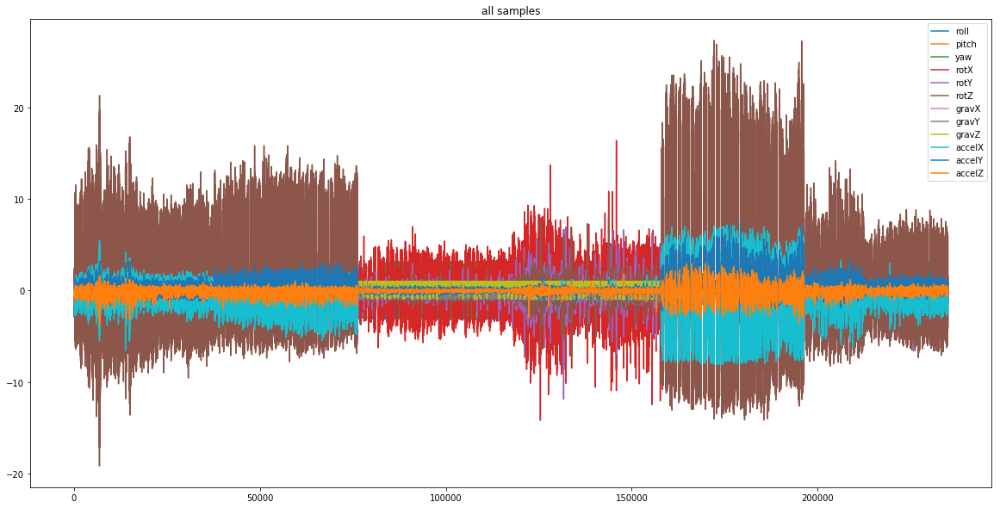

In [14]:
utils.plot_gesture_activity(train_sf)

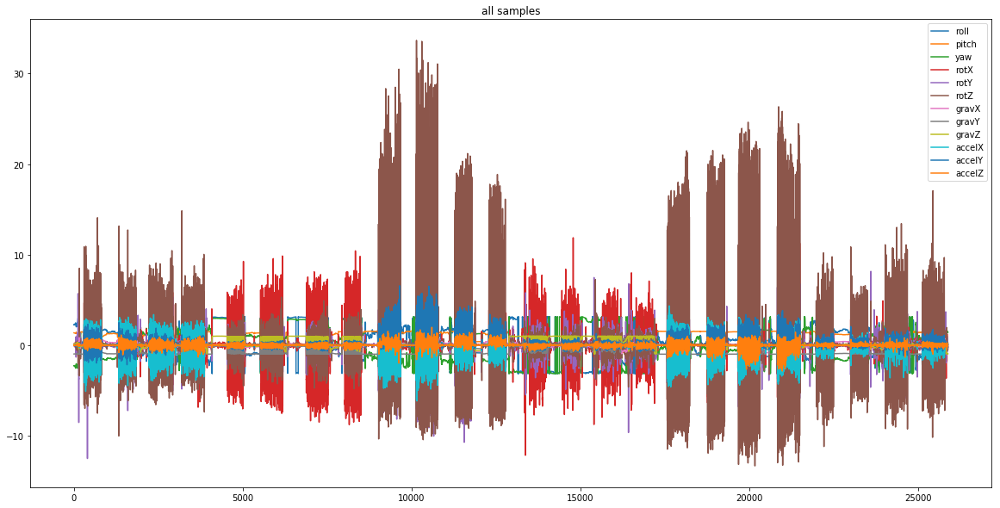

In [15]:
utils.plot_gesture_activity(valid_sf)

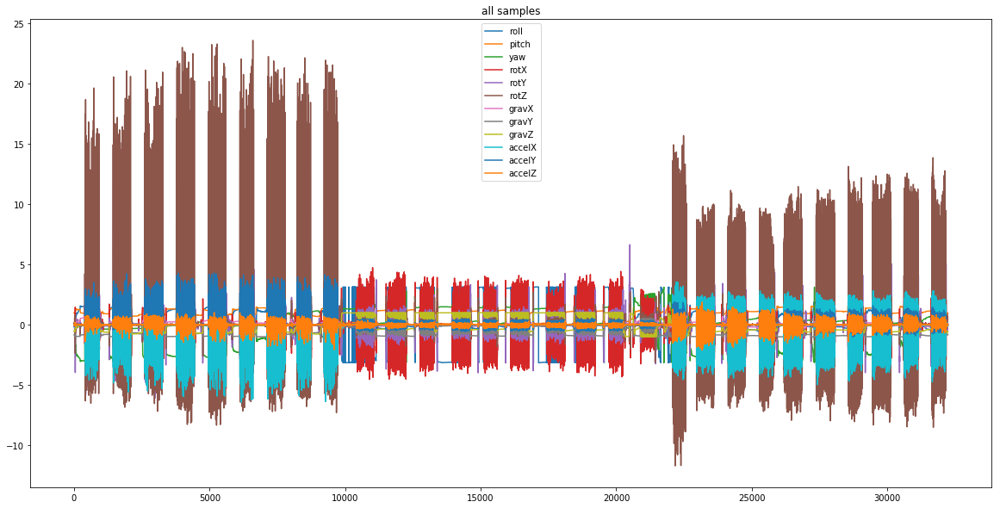

In [16]:
utils.plot_gesture_activity(test_sf)

Plot each of the activities from each of the datasets, just to make sure they all seem reasonably the same. Obviously they won't be identicaly (nor should they be), but there might be a problem if an activity looks drastically different in one section versus another.

Keep in mind, each dataset is a different size, so the plots will be at different scales. Don't let scale differences in the plots mislead you into thinking the data is actually different enough to be worrisome.

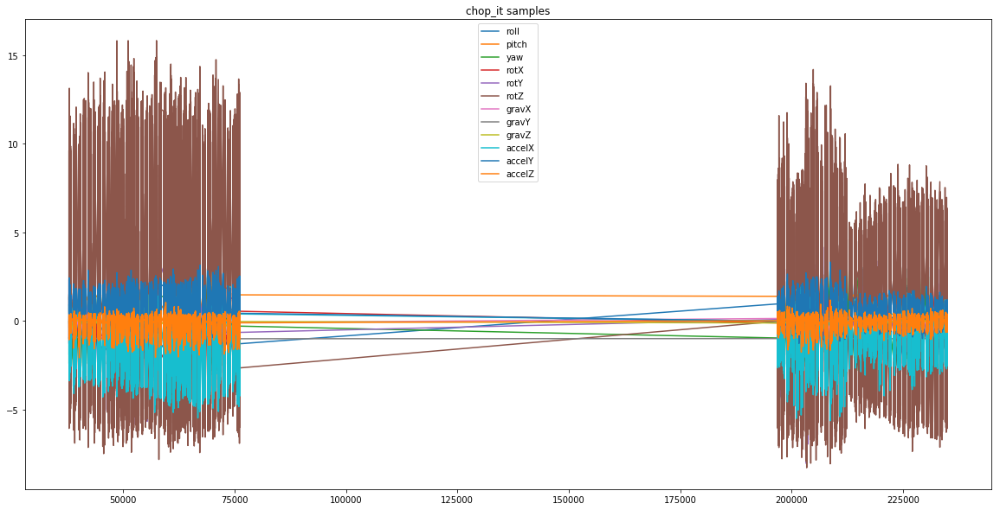

In [17]:
utils.plot_gesture_activity(train_sf, activity="chop_it")

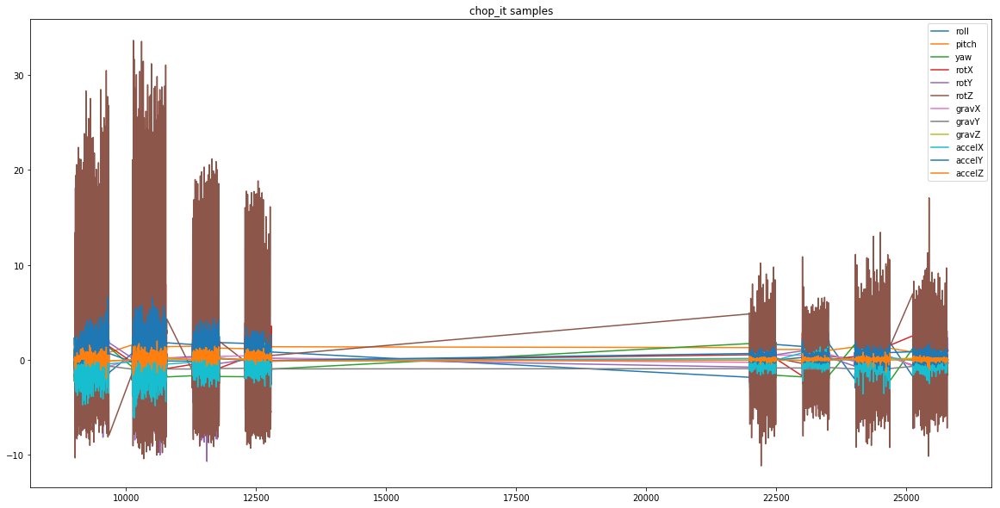

In [18]:
utils.plot_gesture_activity(valid_sf, activity="chop_it")

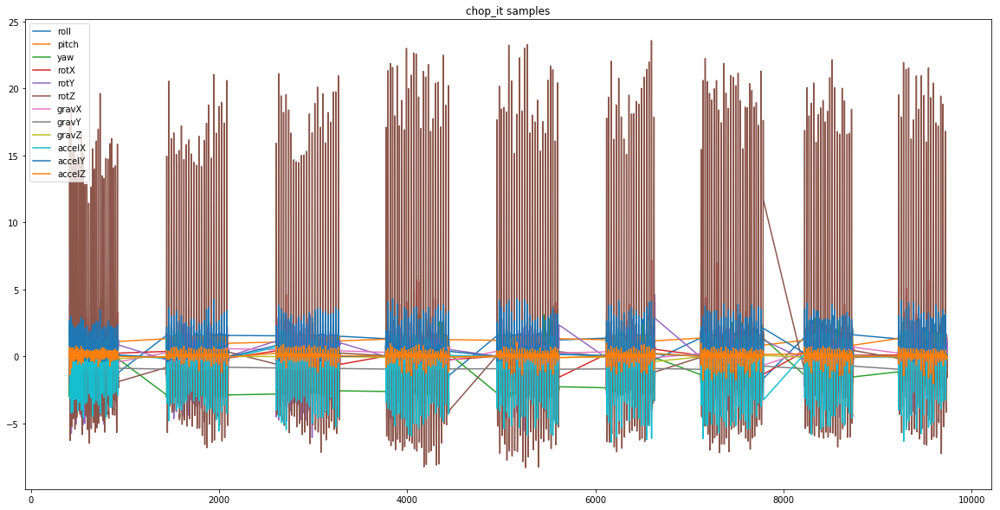

In [19]:
utils.plot_gesture_activity(test_sf, activity="chop_it")

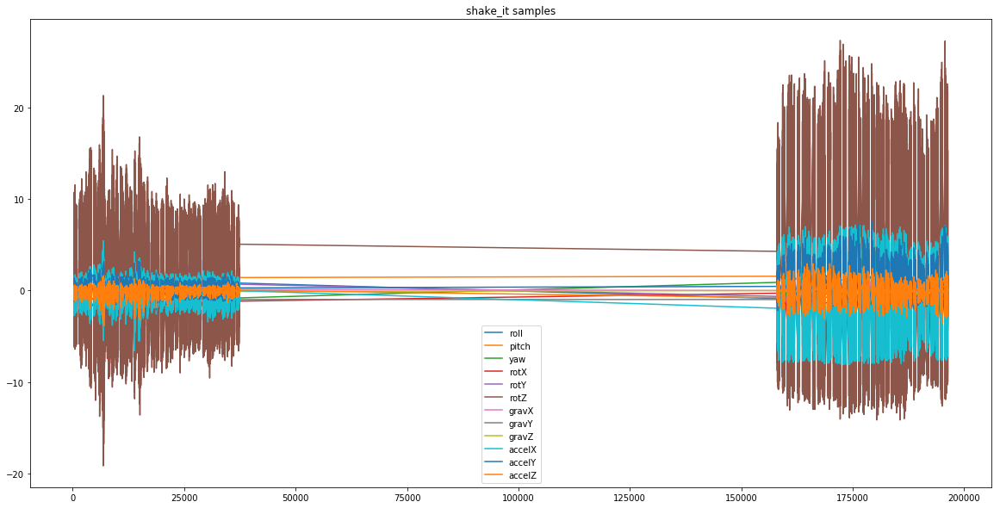

In [20]:
utils.plot_gesture_activity(train_sf, activity="shake_it")

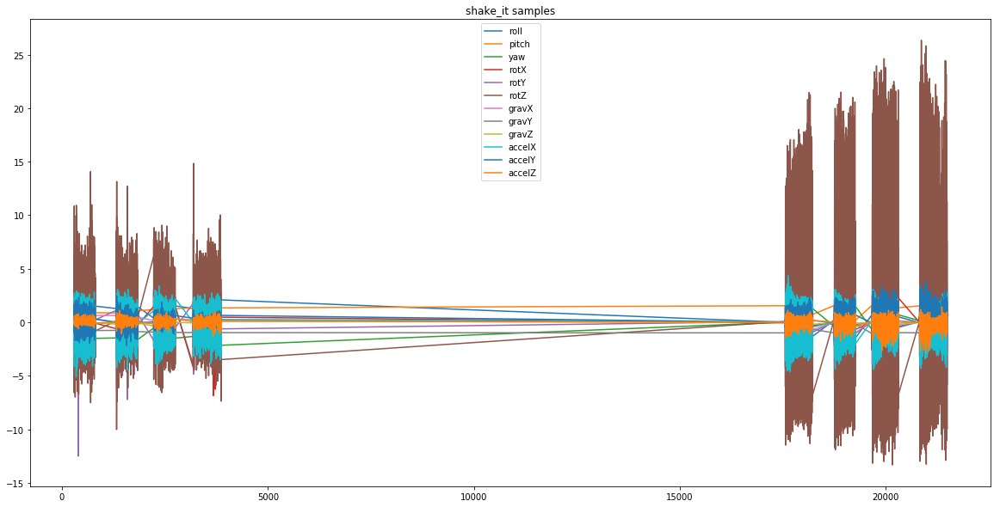

In [21]:
utils.plot_gesture_activity(valid_sf, activity="shake_it")

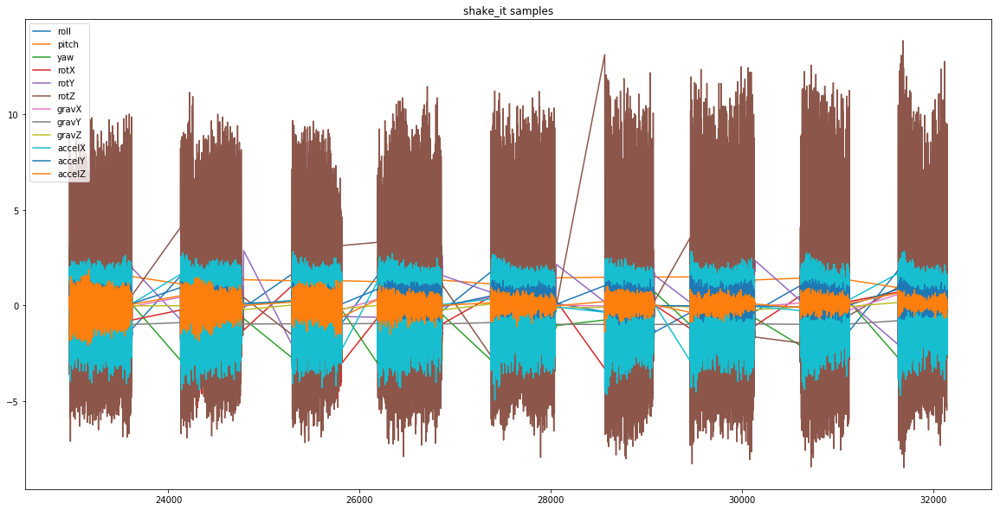

In [22]:
utils.plot_gesture_activity(test_sf, activity="shake_it")

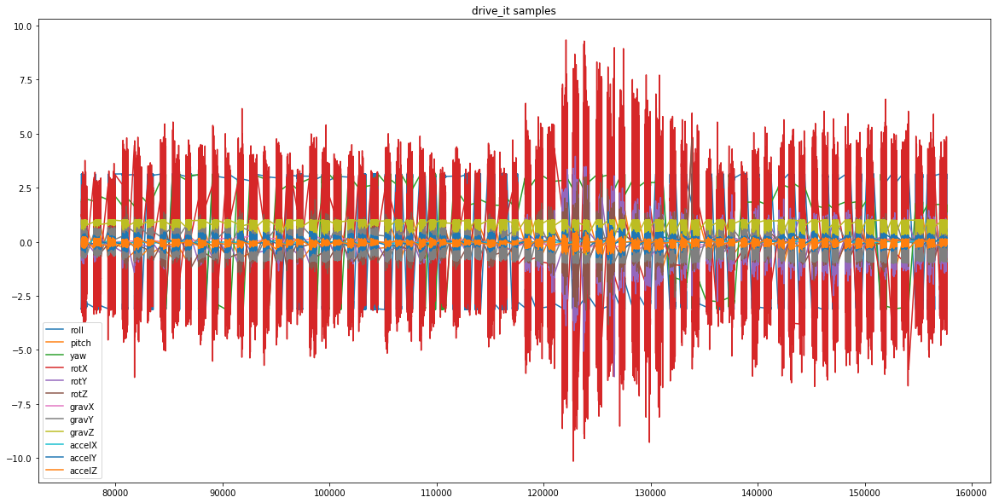

In [23]:
utils.plot_gesture_activity(train_sf, activity="drive_it")

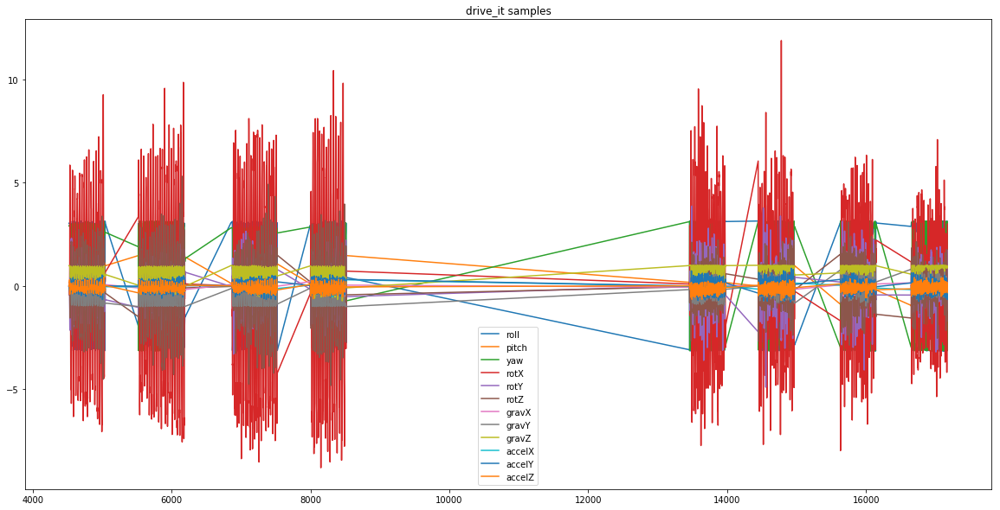

In [24]:
utils.plot_gesture_activity(valid_sf, activity="drive_it")

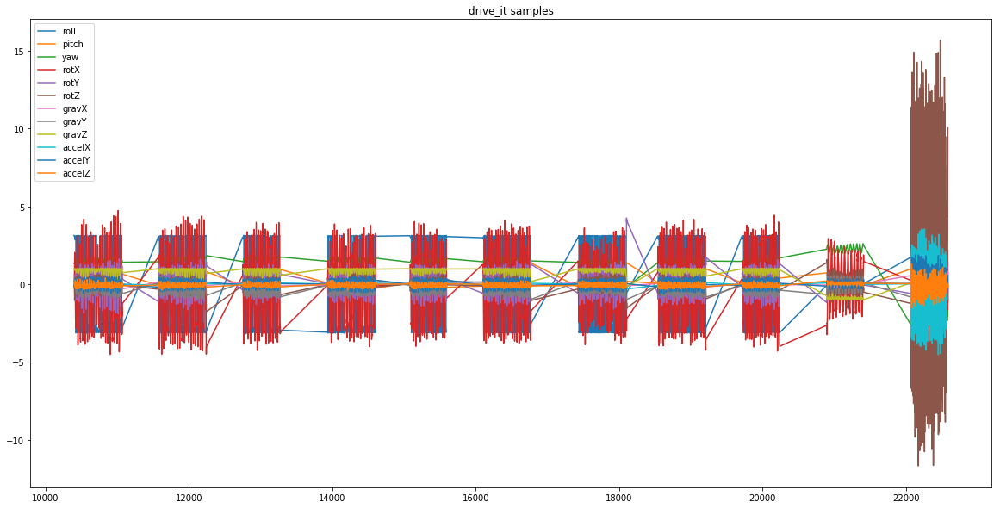

In [25]:
utils.plot_gesture_activity(test_sf, activity="drive_it")

Zoom in on the patterns to compare them more accurately. The following plots show sequences of 500 samples for each of the activities from each of the datasets.

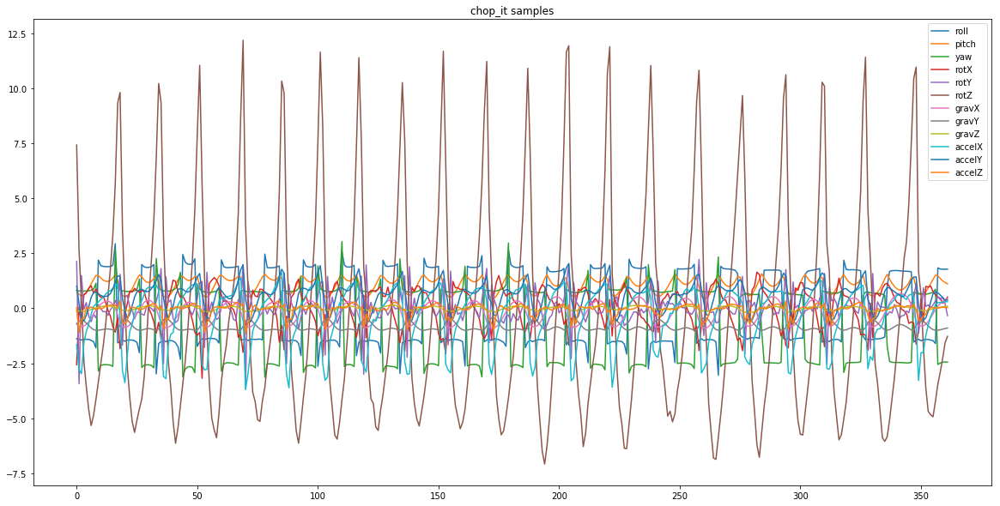

In [26]:
utils.plot_gesture_activity(train_sf[49750:50250], activity="chop_it")

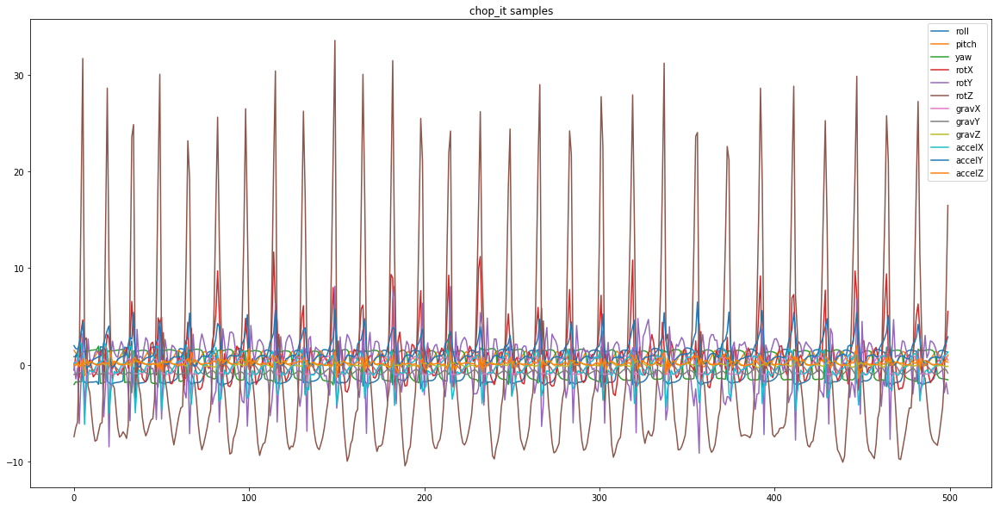

In [27]:
utils.plot_gesture_activity(valid_sf[10150:10650], activity="chop_it")

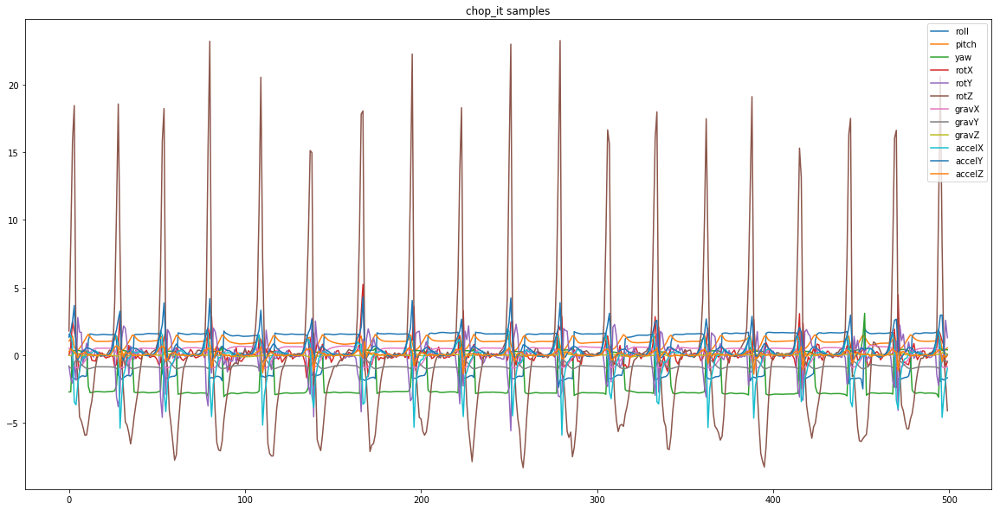

In [28]:
utils.plot_gesture_activity(test_sf[5000:5500], activity="chop_it")

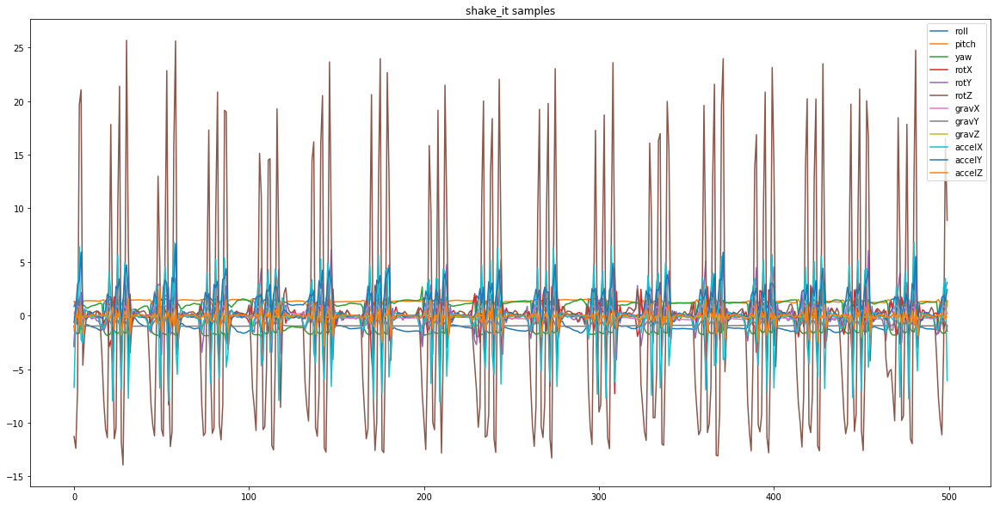

In [29]:
utils.plot_gesture_activity(train_sf[174250:174750], activity="shake_it")

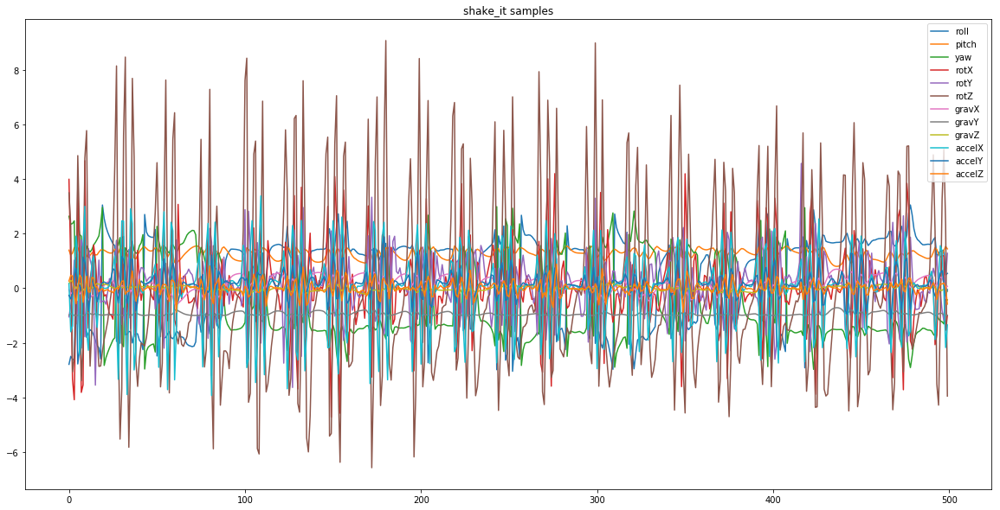

In [30]:
utils.plot_gesture_activity(valid_sf[2250:2750], activity="shake_it")

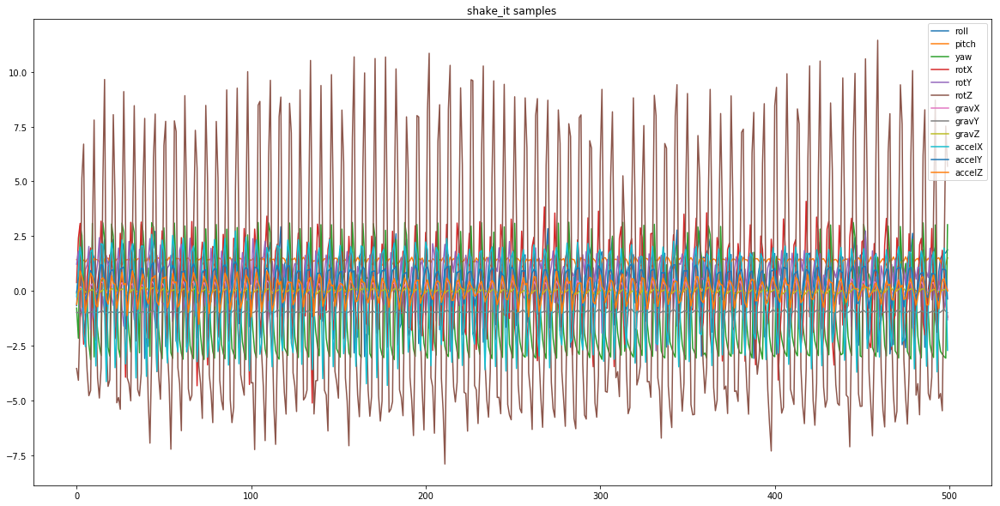

In [31]:
utils.plot_gesture_activity(test_sf[26250:26750], activity="shake_it")

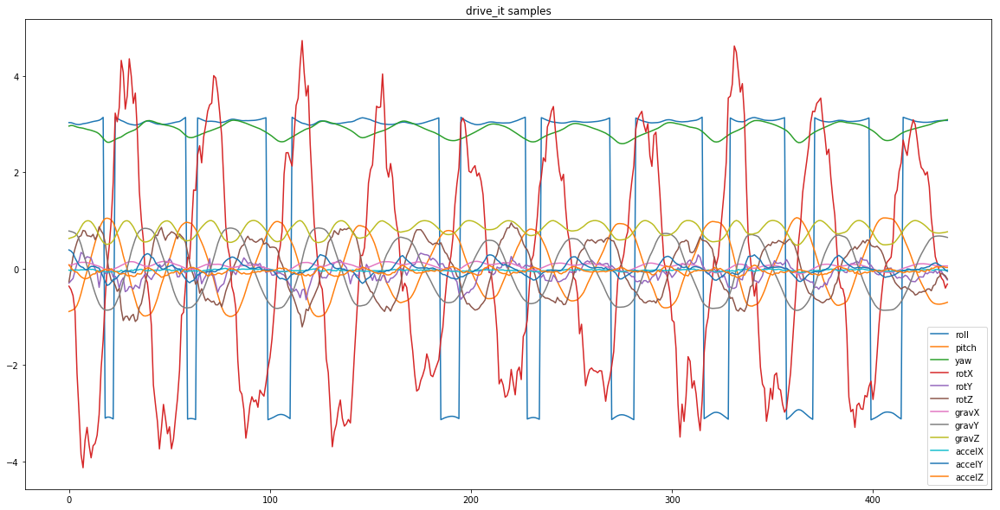

In [32]:
utils.plot_gesture_activity(train_sf[106300:106800], activity="drive_it")

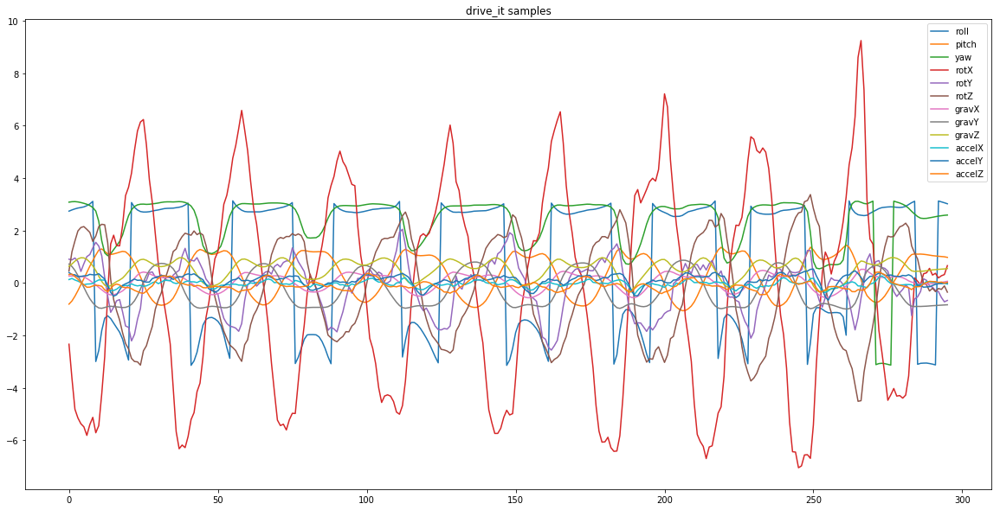

In [33]:
utils.plot_gesture_activity(valid_sf[4750:5250], activity="drive_it")

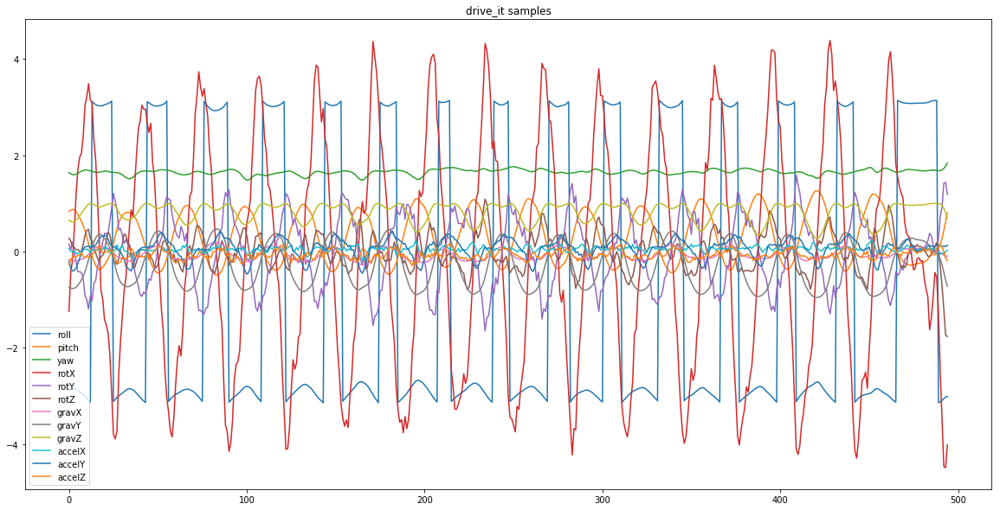

In [34]:
utils.plot_gesture_activity(test_sf[11750:12250], activity="drive_it")

Zoom in on the patterns even further to compare them more accurately. The following nine plots show sequences of 100 samples for each of the activities from each of the datasets.

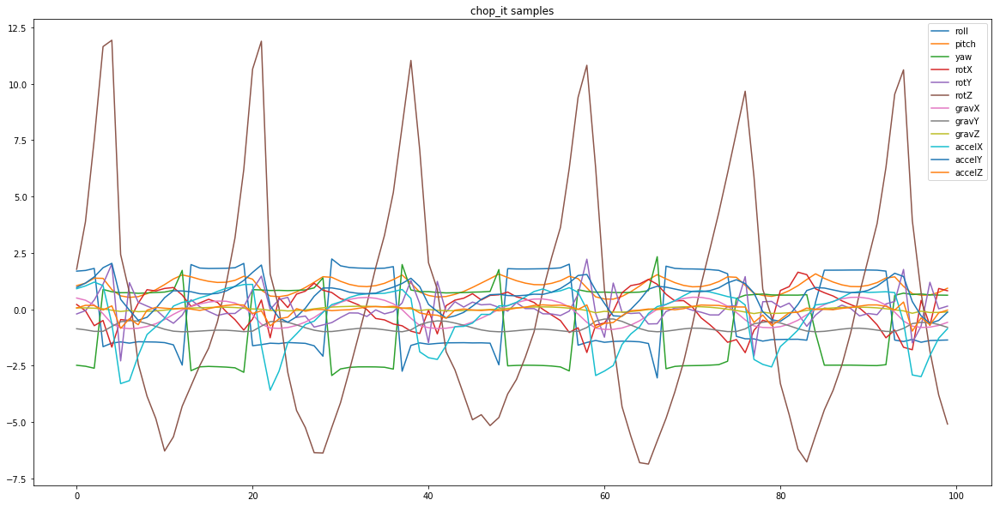

In [35]:
utils.plot_gesture_activity(train_sf[49950:50050], activity="chop_it")

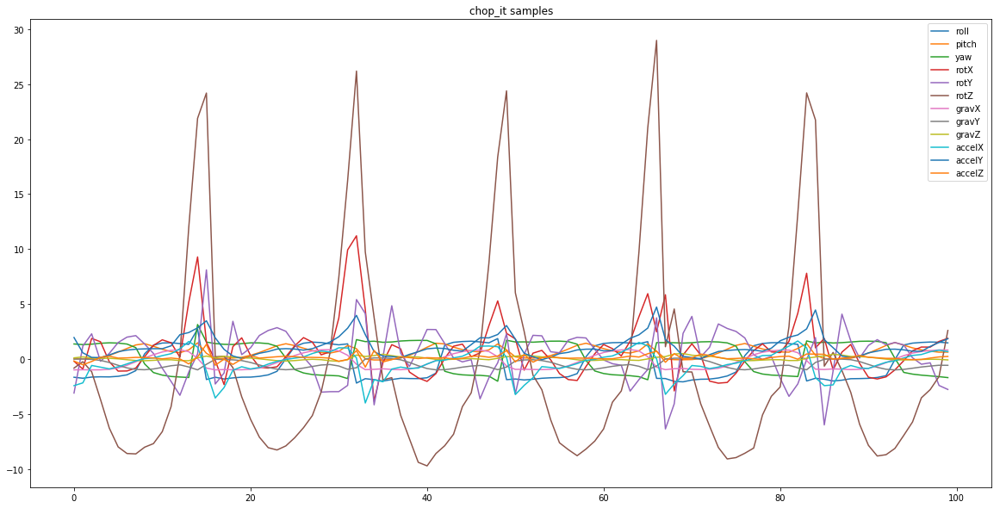

In [36]:
utils.plot_gesture_activity(valid_sf[10350:10450], activity="chop_it")

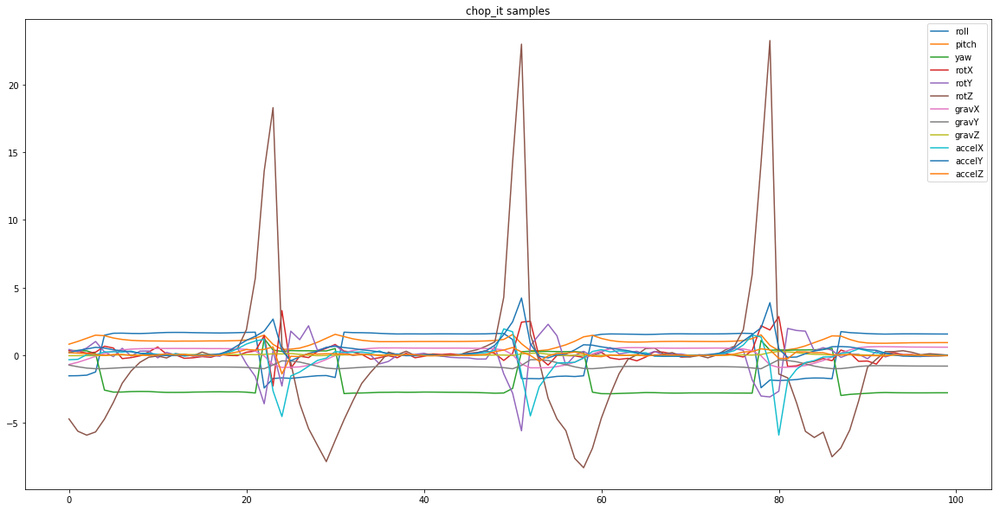

In [37]:
utils.plot_gesture_activity(test_sf[5200:5300], activity="chop_it")

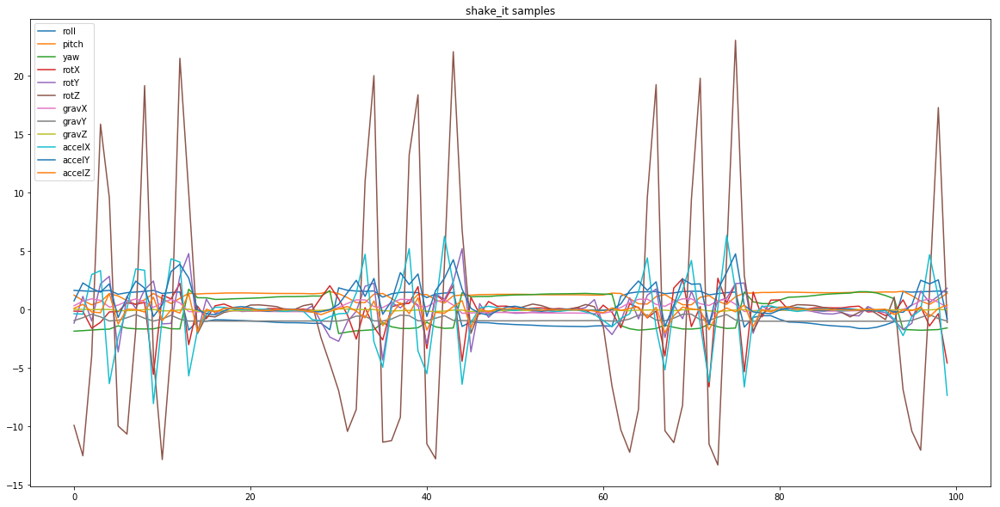

In [38]:
utils.plot_gesture_activity(train_sf[174450:174550], activity="shake_it")

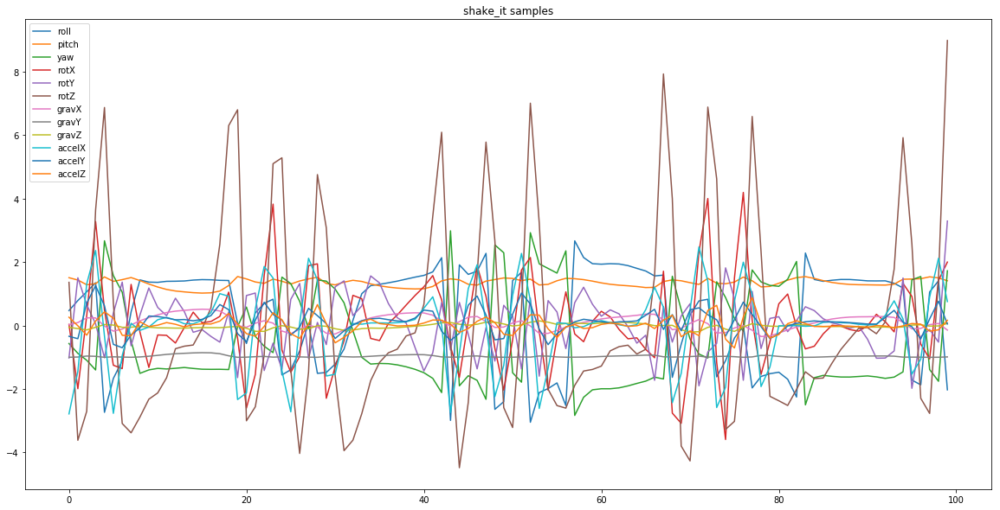

In [39]:
utils.plot_gesture_activity(valid_sf[2450:2550], activity="shake_it")

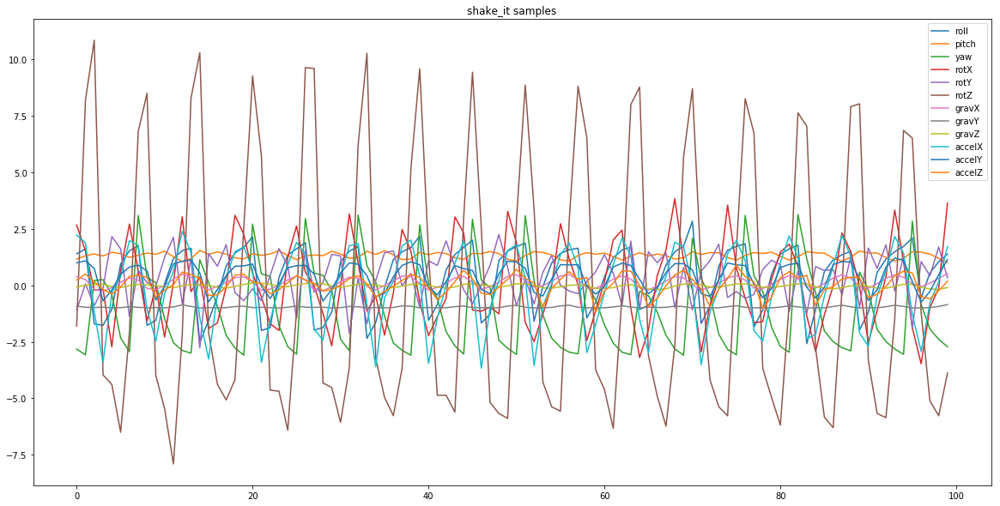

In [40]:
utils.plot_gesture_activity(test_sf[26450:26550], activity="shake_it")

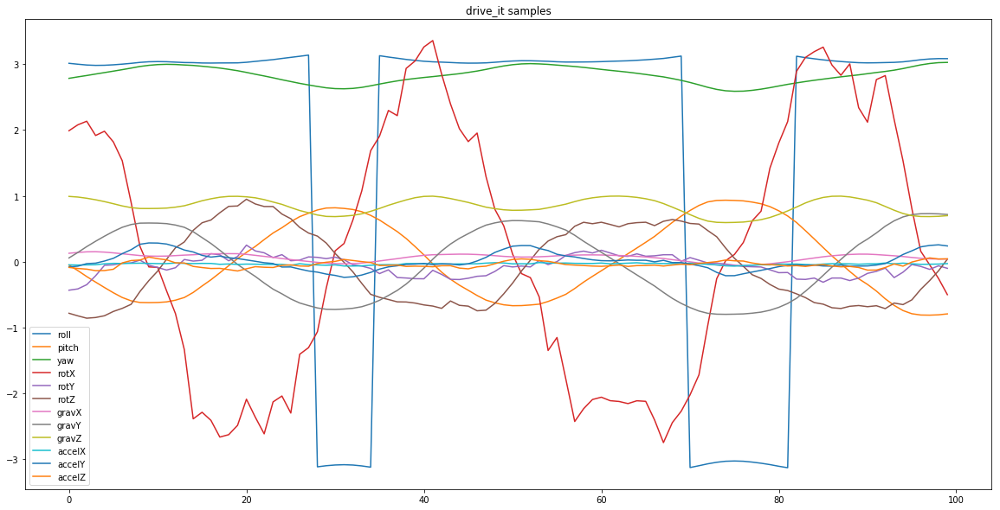

In [41]:
utils.plot_gesture_activity(train_sf[106500:106600], activity="drive_it")

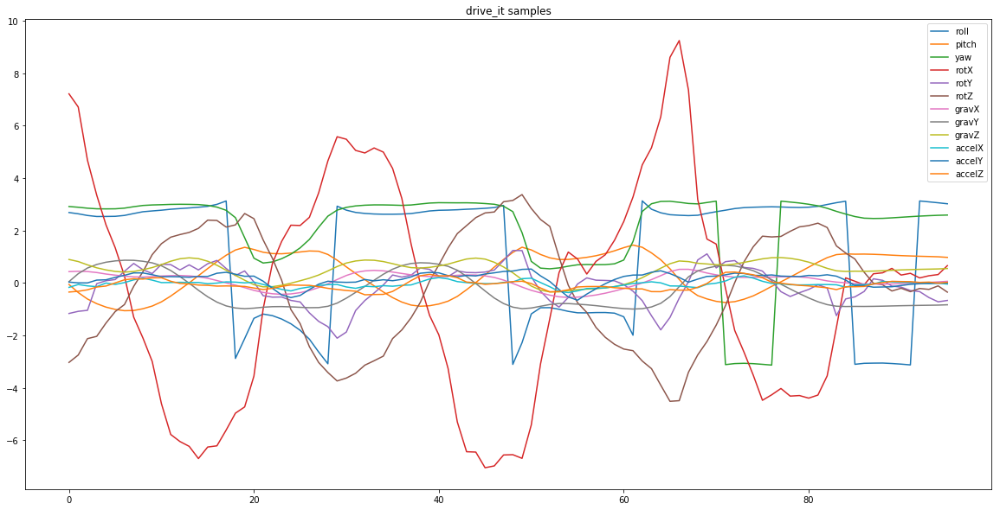

In [42]:
utils.plot_gesture_activity(valid_sf[4950:5050], activity="drive_it")

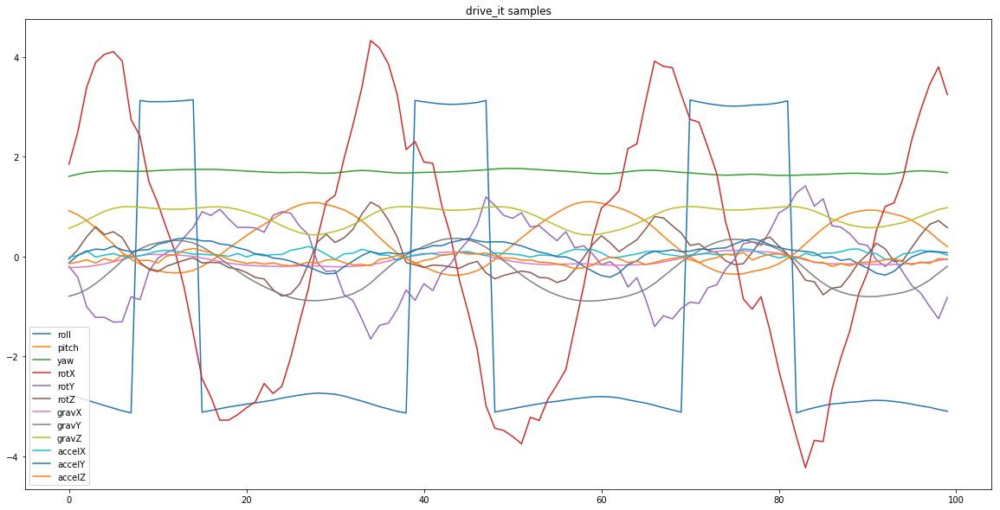

In [43]:
utils.plot_gesture_activity(test_sf[11950:12050], activity="drive_it")

Can compare data by user to see if a few things:

1. How much variation is there between users?
2. Did any particular user have problems performing an activity?

If some users perform an activity in drastically different ways from others, then you have a choice to make. Stick with your current dataset and hope you have enough data to account for this variation, collect more data to ensure you have enough, or remove that user's data if you decide you don't *want* your model to recognize that activity as correctly performed.

**Important**: If you choose the third option above, be sure you aren't making your model more difficult to use for people who may perform activies differently. People move in different ways for all sorts of reasons, and choices you make here will directly affect who can successfully use your app. 

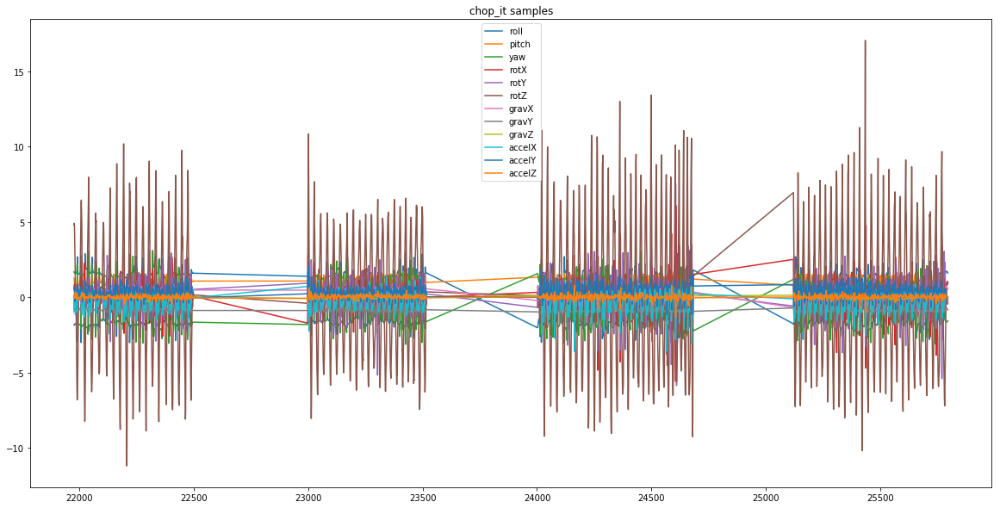

In [44]:
utils.plot_gesture_activity(valid_sf, userId="u_03", activity="chop_it")

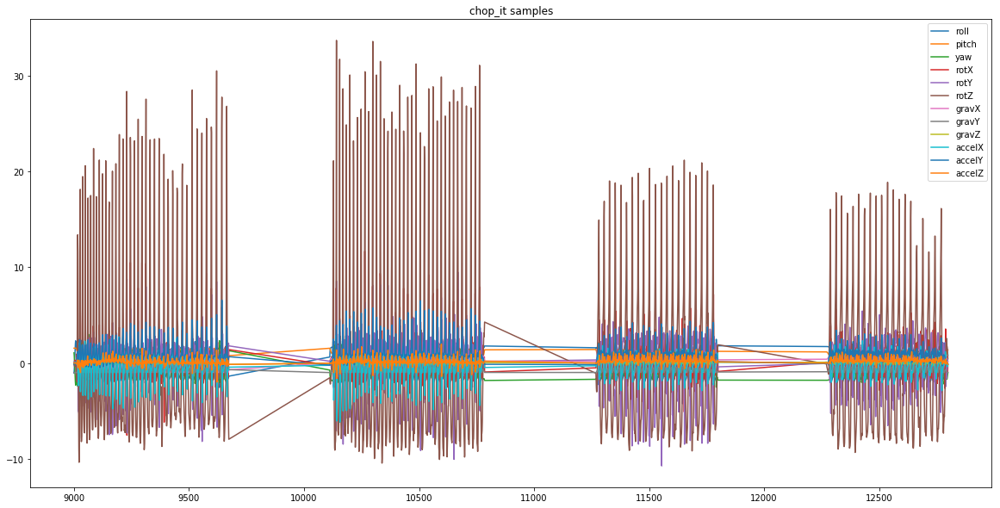

In [45]:
utils.plot_gesture_activity(valid_sf, userId="u_04", activity="chop_it")

Just to take a closer look at the patterns involved, the following 12 plots show the same 100-sample segments of the training set displayed above, but these show just three features at a time. Notice how patterns are visible even without using every feature.

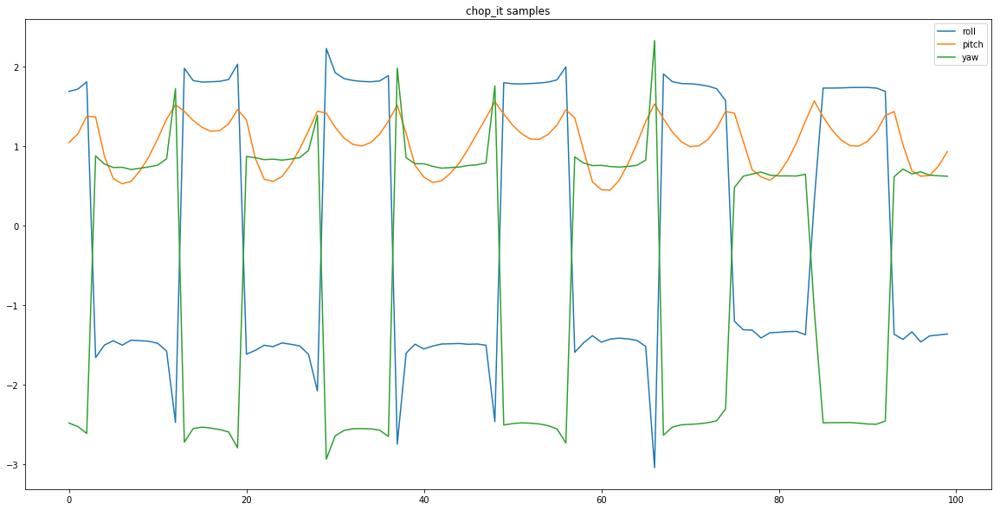

In [46]:
utils.plot_gesture_activity(train_sf[49950:50050], activity="chop_it", features=["roll", "pitch", "yaw"])

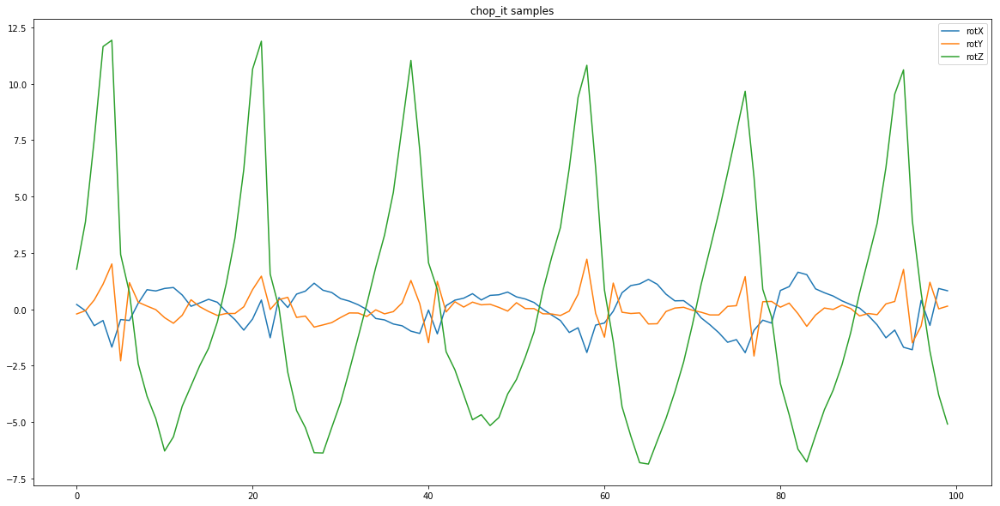

In [47]:
utils.plot_gesture_activity(train_sf[49950:50050], activity="chop_it", features=["rotX", "rotY", "rotZ"])

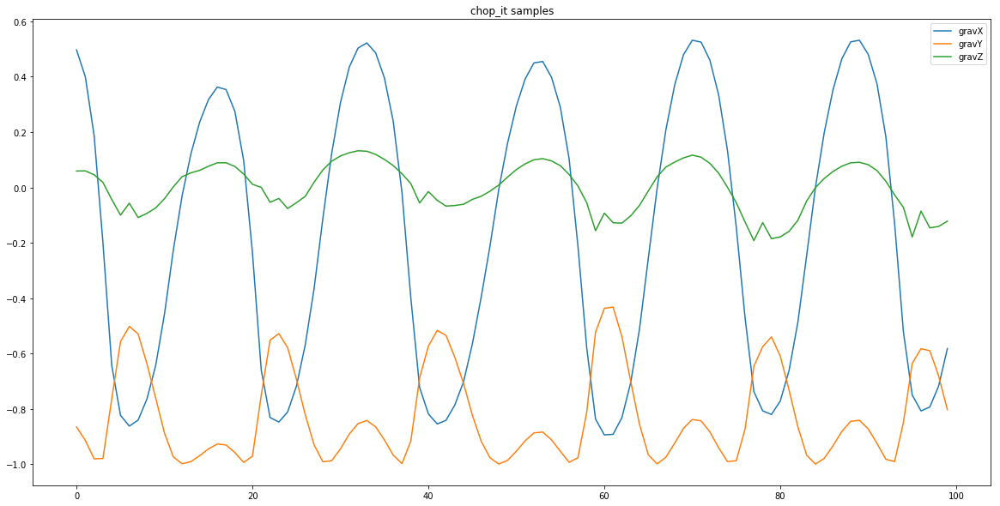

In [48]:
utils.plot_gesture_activity(train_sf[49950:50050], activity="chop_it", features=["gravX", "gravY", "gravZ"])

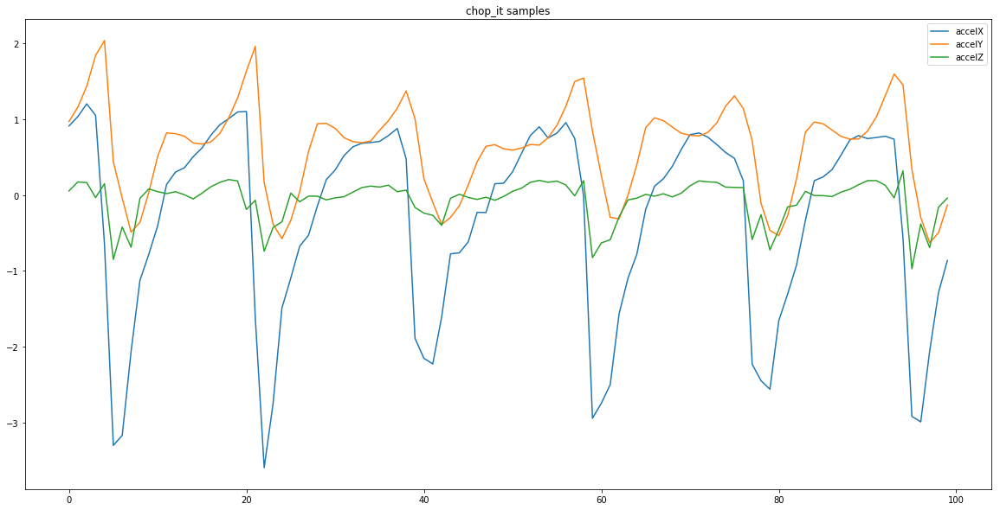

In [49]:
utils.plot_gesture_activity(train_sf[49950:50050], activity="chop_it", features=["accelX", "accelY", "accelZ"])

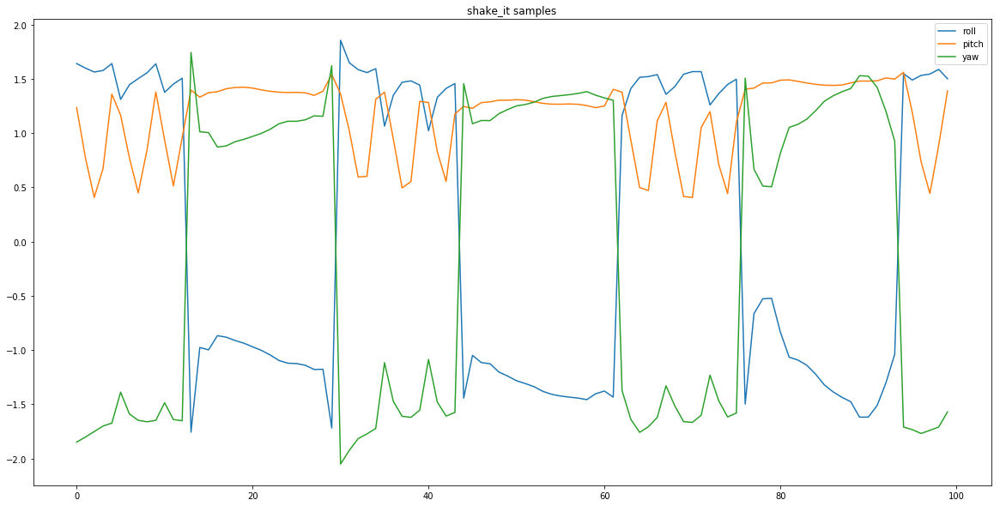

In [50]:
utils.plot_gesture_activity(train_sf[174450:174550], activity="shake_it", features=["roll", "pitch", "yaw"])

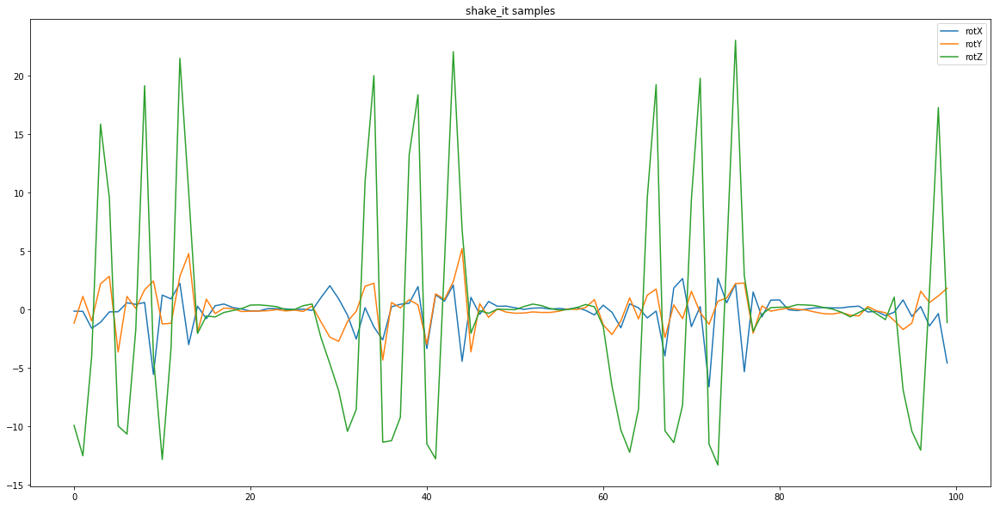

In [51]:
utils.plot_gesture_activity(train_sf[174450:174550], activity="shake_it", features=["rotX", "rotY", "rotZ"])

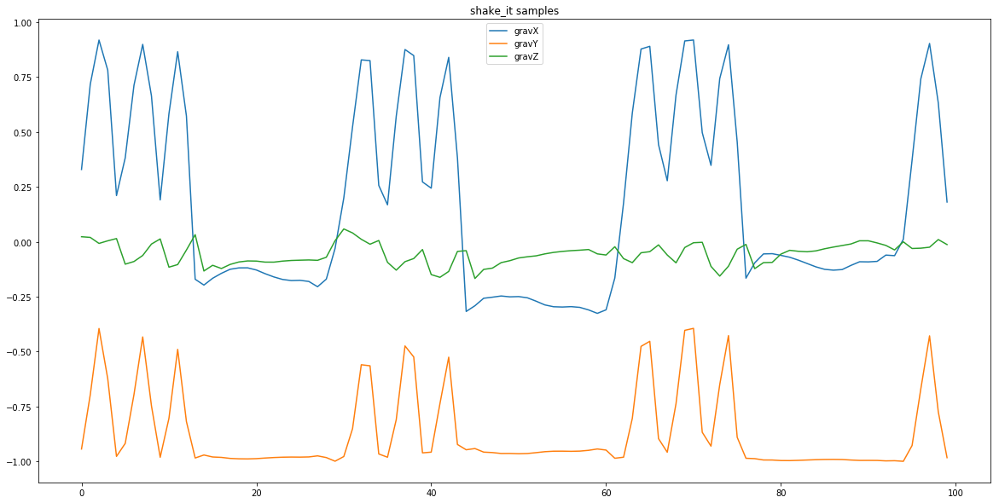

In [52]:
utils.plot_gesture_activity(train_sf[174450:174550], activity="shake_it", features=["gravX", "gravY", "gravZ"])

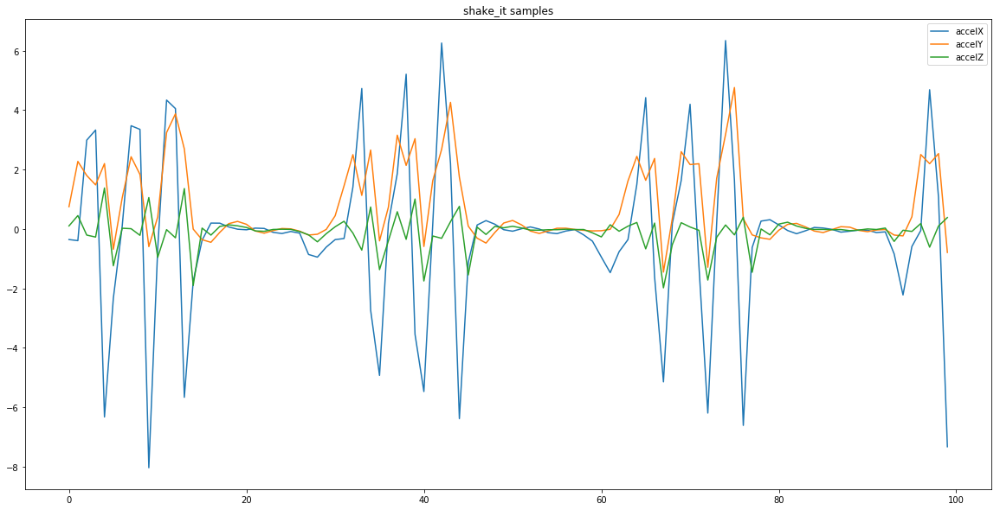

In [53]:
utils.plot_gesture_activity(train_sf[174450:174550], activity="shake_it", features=["accelX", "accelY", "accelZ"])

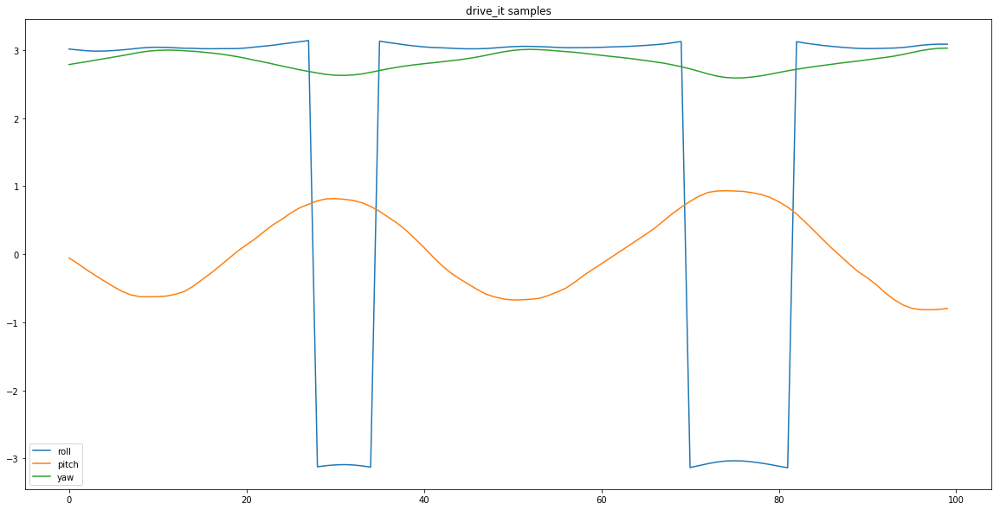

In [54]:
utils.plot_gesture_activity(train_sf[106500:106600], activity="drive_it", features=["roll", "pitch", "yaw"])

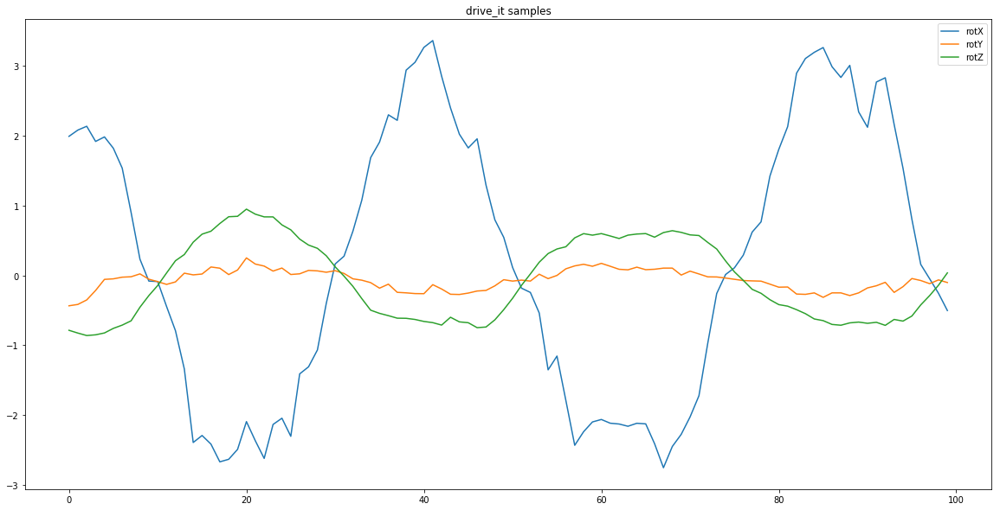

In [55]:
utils.plot_gesture_activity(train_sf[106500:106600], activity="drive_it", features=["rotX", "rotY", "rotZ"])

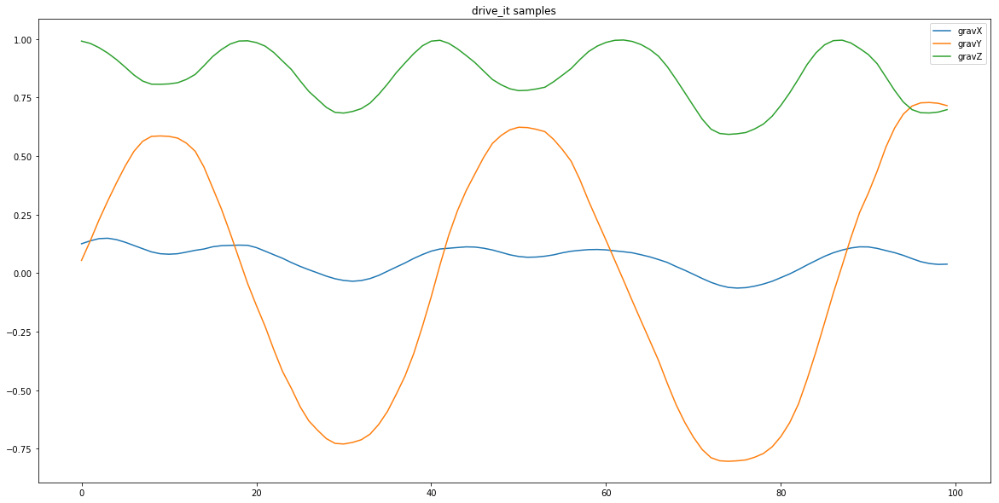

In [56]:
utils.plot_gesture_activity(train_sf[106500:106600], activity="drive_it", features=["gravX", "gravY", "gravZ"])

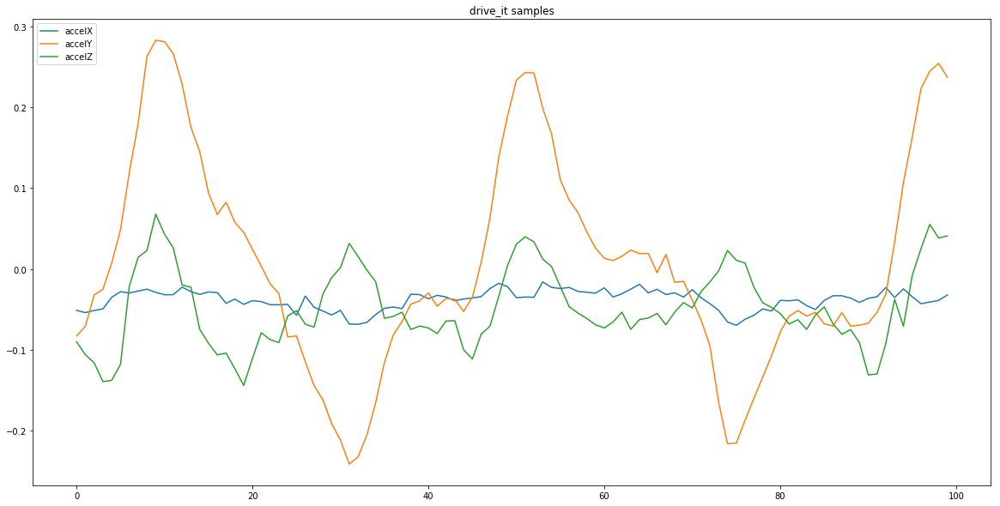

In [57]:
utils.plot_gesture_activity(train_sf[106500:106600], activity="drive_it", features=["accelX", "accelY", "accelZ"])

## Remove bad data

Identify sequences that might make your model worse. The following section finds and removes some bad examples of the drive_it activity.

The first plot shows a bit of good drive_it data – "good" meaning data that looks similar to all the other drive_it data in the three datasets – and then the last two sequences look different.

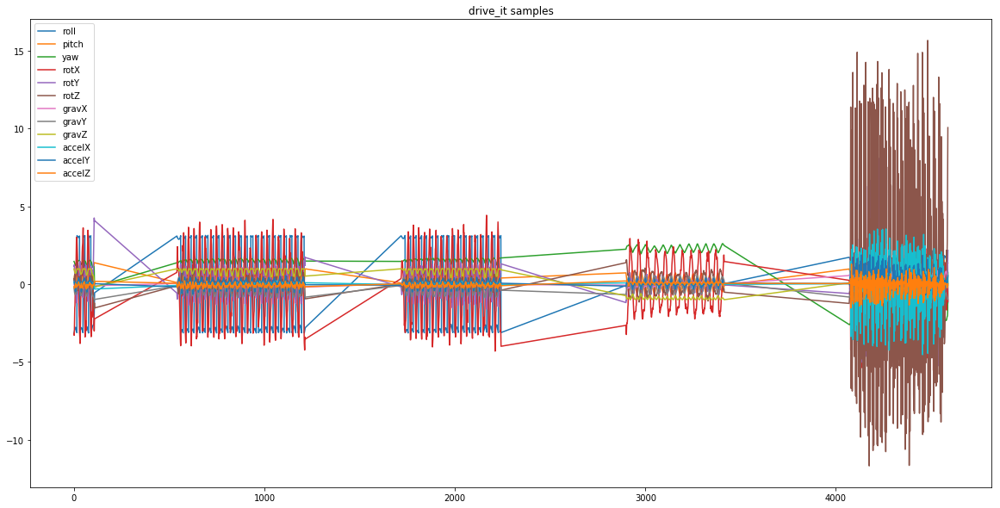

In [58]:
utils.plot_gesture_activity(test_sf[18000:], activity="drive_it")

Just zooming in to show a nice comparison of good (on the left) and suspicious (the middle and right) sequences.

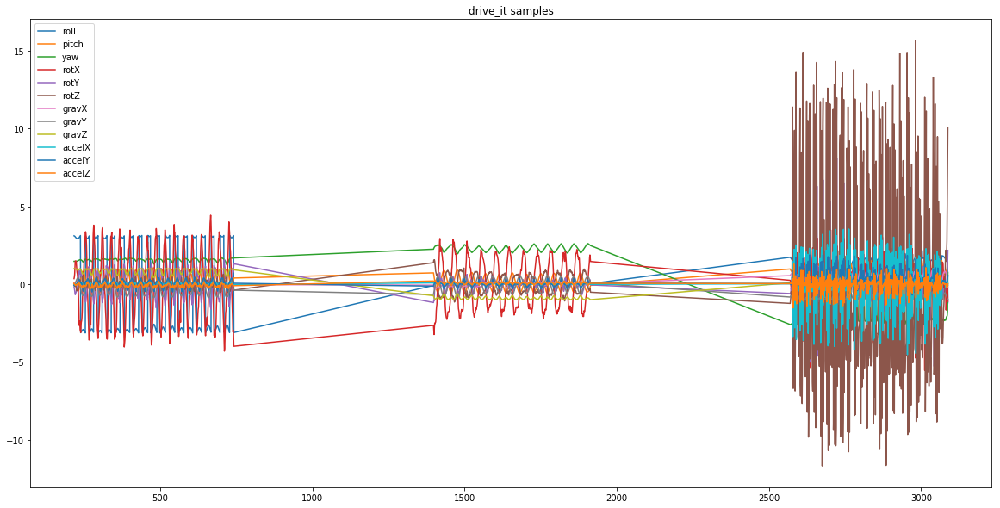

In [59]:
utils.plot_gesture_activity(test_sf[19500:], activity="drive_it")

Most of the drive_it data looks like the following sequence:

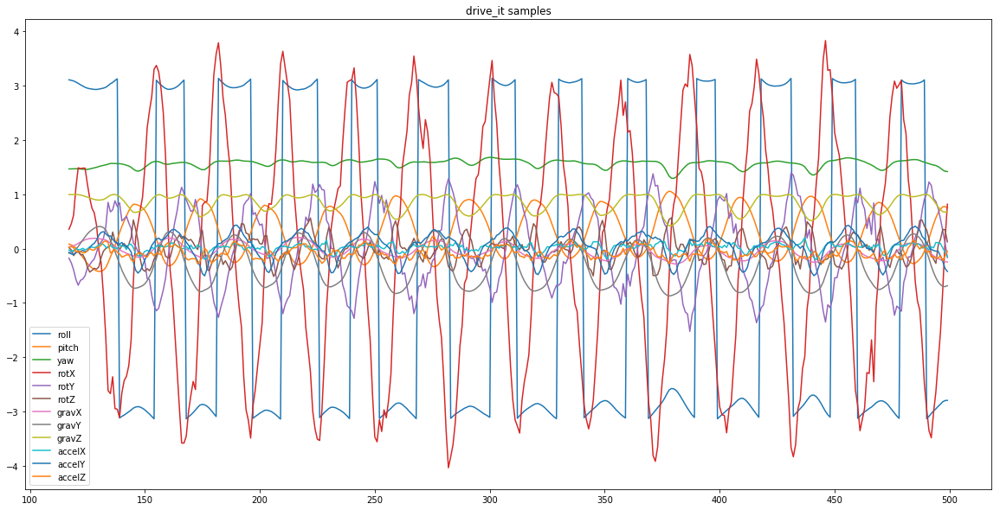

In [60]:
utils.plot_gesture_activity(test_sf[19600:20100], activity="drive_it")

The following plots show one of the suspicious drive_it sequences. It seems more like shake_it, so user probably performed the wrong activity. 

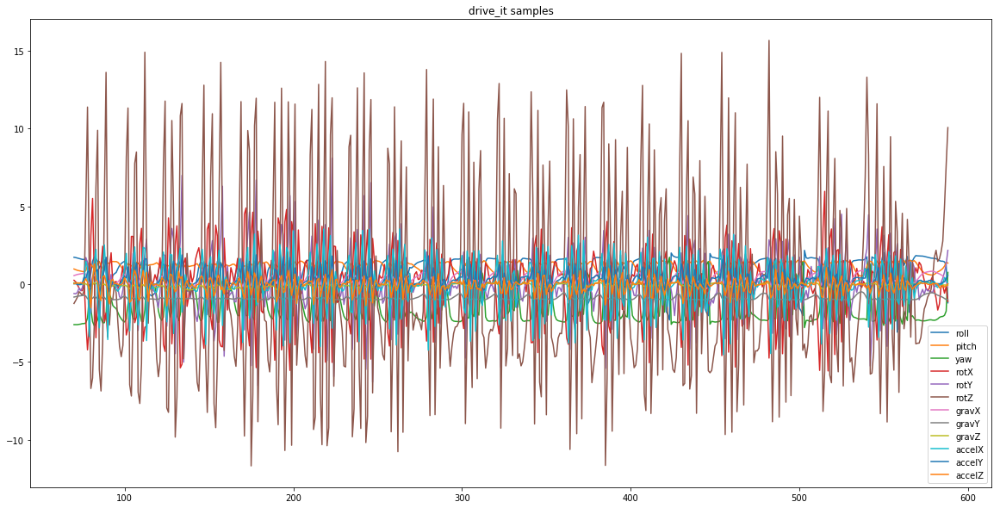

In [61]:
utils.plot_gesture_activity(test_sf[22000:], activity="drive_it")

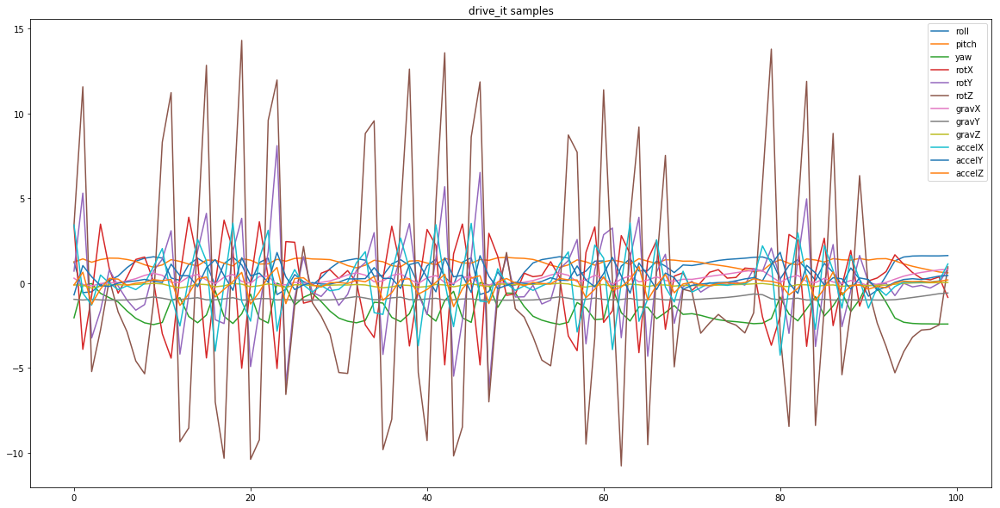

In [62]:
utils.plot_gesture_activity(test_sf[22200:22300], activity="drive_it")

And the following plots show the other suspicious drive_it sequence. Close inspection shows that gravity along the Z axis is pointing in the opposite direction from the other drive_it samples. This indicates the user was holding the their phone with the screen facing up instead of down, contrary to the instructions.  

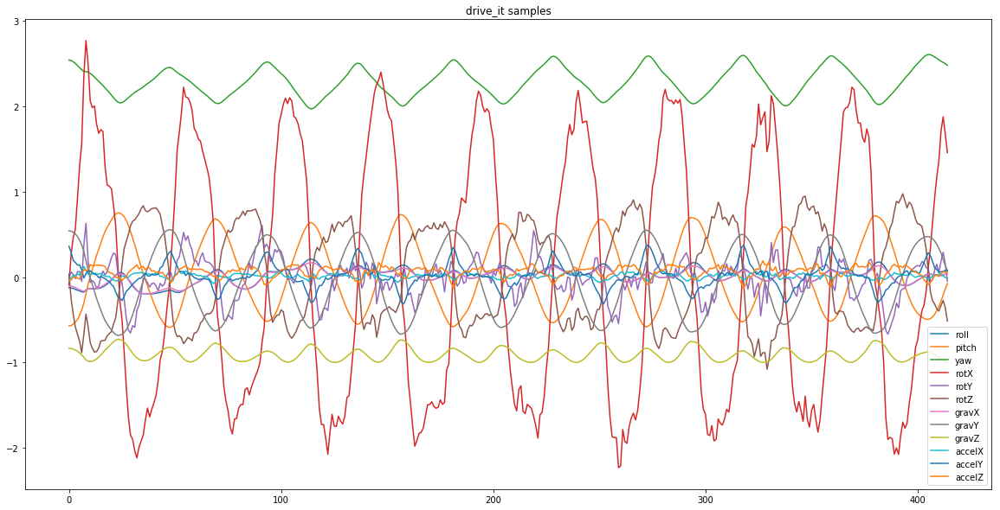

In [63]:
utils.plot_gesture_activity(test_sf[21000:22000], activity="drive_it")

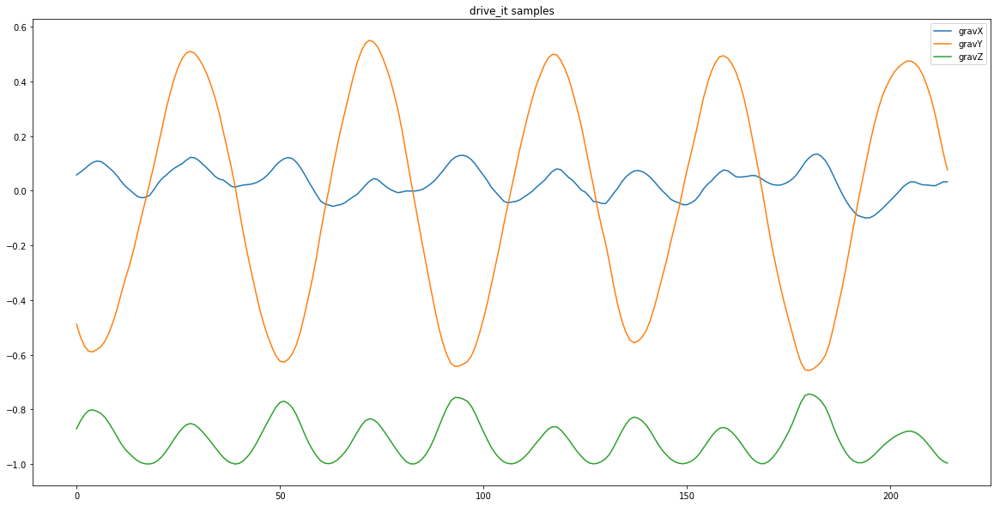

In [64]:
utils.plot_gesture_activity(test_sf[21200:21500], activity="drive_it", features=["gravX", "gravY", "gravZ"])

For comparison, here is what a good section of drive_it data looks like:

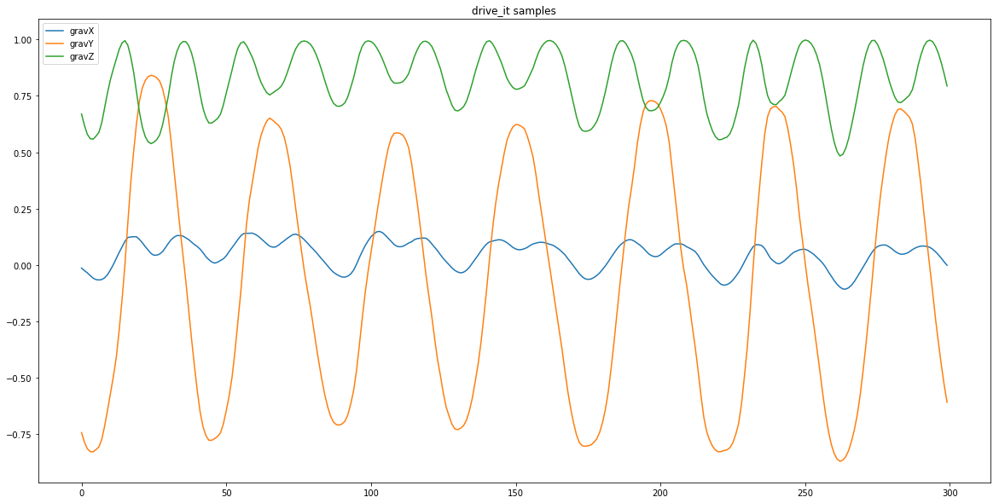

In [65]:
utils.plot_gesture_activity(train_sf[106400:106700], activity="drive_it", features=["gravX", "gravY", "gravZ"])

Find the session IDs for the bad sequences and remove those sessions from the test set. 

In [66]:
bad_session_1 = test_sf[21350]["sessionId"]
bad_session_2 = test_sf[22250]["sessionId"]
test_sf = test_sf.filter_by([bad_session_1, bad_session_2], column_name='sessionId', exclude=True)

The following plots show the test set no longer includes those bad sessions.

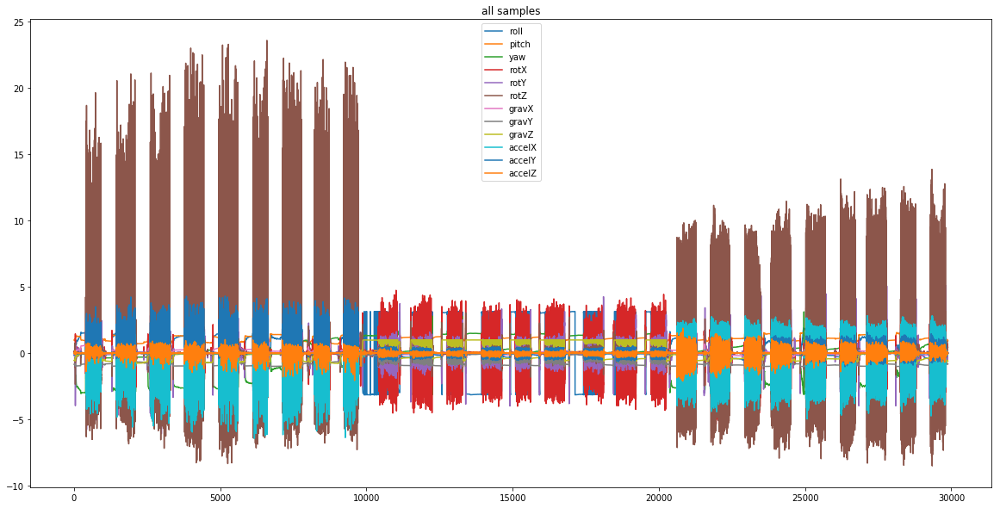

In [67]:
utils.plot_gesture_activity(test_sf)

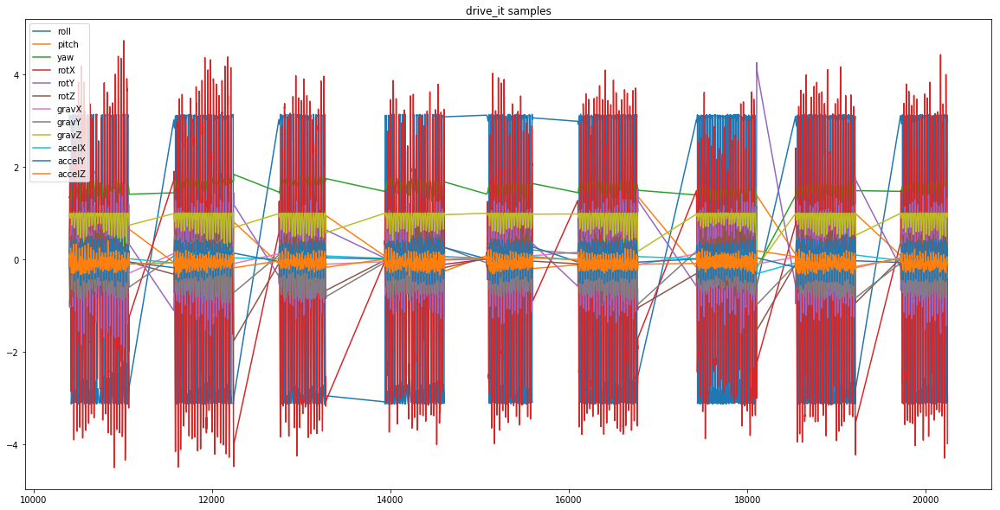

In [68]:
utils.plot_gesture_activity(test_sf, activity="drive_it")

## Verify the datasets are balanced

It's not always possible to have a completely balanced dataset, but it's important to know the class distributions you're working with.

The following code counta how many sequences are in each dataset, by activity and user.

In [69]:
utils.count_activities(train_sf)
utils.count_activities(valid_sf)
utils.count_activities(test_sf)

+----------+--------+-------+
| activity | userId | Count |
+----------+--------+-------+
| chop_it  |  u_01  |   36  |
| chop_it  |  u_02  |   36  |
| drive_it |  u_01  |   36  |
| drive_it |  u_02  |   36  |
| rest_it  |  u_01  |  108  |
| rest_it  |  u_02  |  108  |
| shake_it |  u_01  |   36  |
| shake_it |  u_02  |   36  |
+----------+--------+-------+
[8 rows x 3 columns]

+----------+--------+-------+
| activity | userId | Count |
+----------+--------+-------+
| chop_it  |  u_03  |   4   |
| chop_it  |  u_04  |   4   |
| drive_it |  u_03  |   4   |
| drive_it |  u_04  |   4   |
| rest_it  |  u_03  |   12  |
| rest_it  |  u_04  |   12  |
| shake_it |  u_03  |   4   |
| shake_it |  u_04  |   4   |
+----------+--------+-------+
[8 rows x 3 columns]

+----------+--------+-------+
| activity | userId | Count |
+----------+--------+-------+
| chop_it  |  u_05  |   9   |
| drive_it |  u_05  |   9   |
| rest_it  |  u_05  |   27  |
| shake_it |  u_05  |   9   |
+----------+--------+-----

Notice in the above counts that these datasets are perfectly balanced. No activity is represented more than any other in a particular dataset (except rest_it, which is present the same anount as all the others combined). Likewise, no user is represented more than any other within a dataset.

## Optional: Remove non-activity data

The following plots show the rest_it data from each dataset.

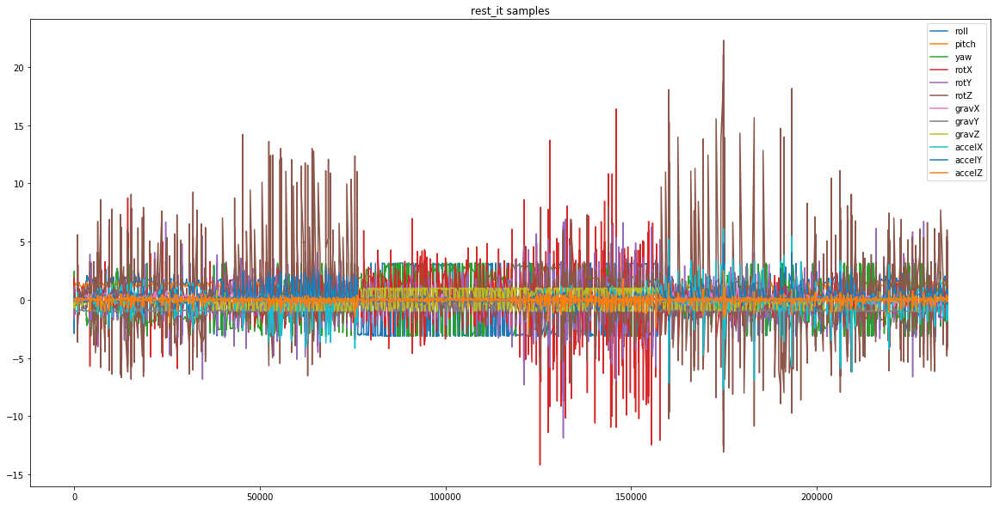

In [70]:
utils.plot_gesture_activity(train_sf, activity="rest_it")

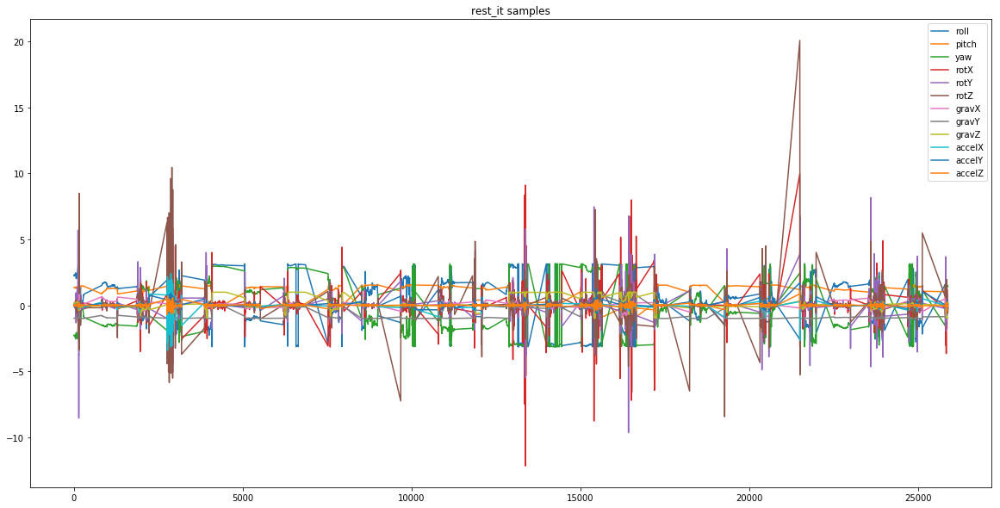

In [71]:
utils.plot_gesture_activity(valid_sf, activity="rest_it")

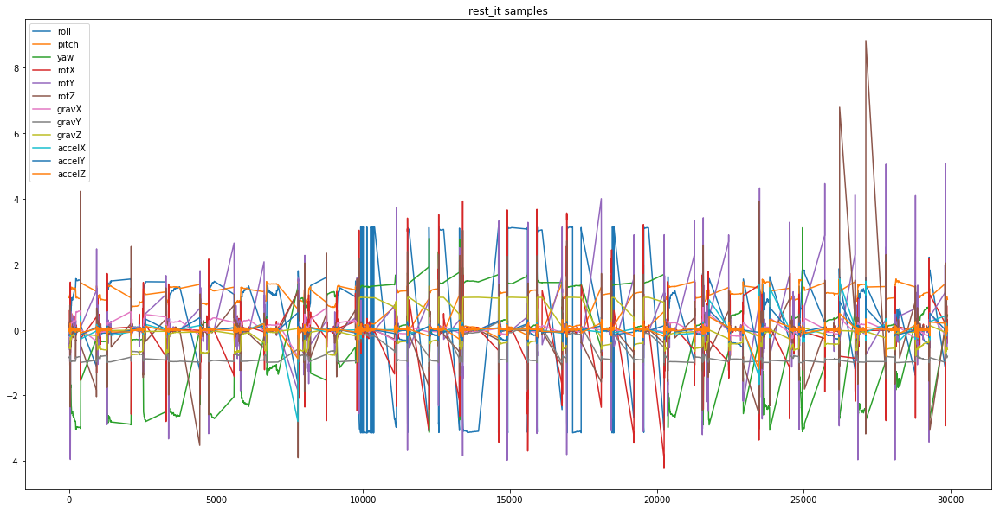

In [72]:
utils.plot_gesture_activity(test_sf, activity="rest_it")

Notive that there aren't reliably discernable patterns in the rest data. That makes sense, since users can do whatever they want between performing activities. Sometimes you'll want to remove this noisy data. This project chooses not to, but here's how to remove it if you'd like to see the difference. 

In [73]:
train_sf_no_rests = train_sf.filter_by(["rest_it"], 'activity', exclude=True)
valid_sf_no_rests = valid_sf.filter_by(["rest_it"], 'activity', exclude=True)
test_sf_no_rests = test_sf.filter_by(["rest_it"], 'activity', exclude=True)

The following plots show the datasets, now free of any resting data.

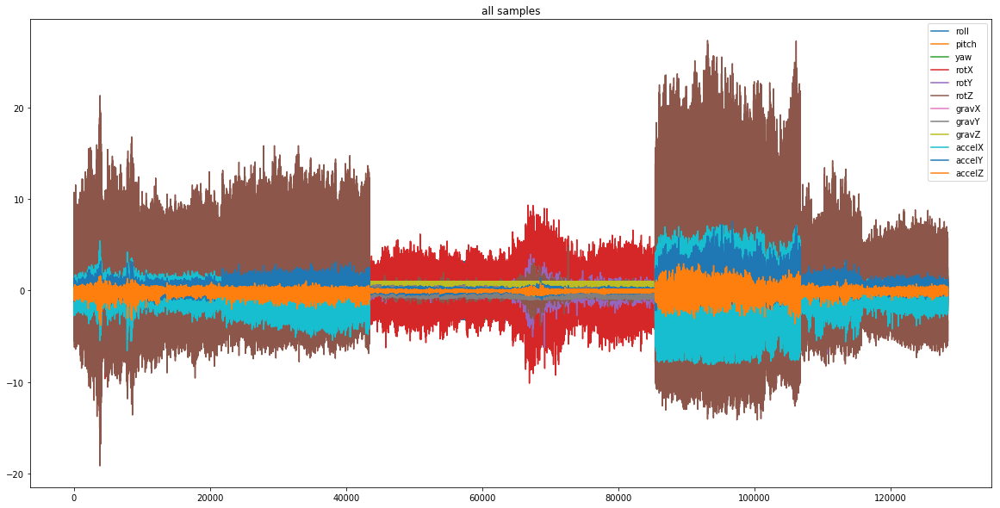

In [74]:
utils.plot_gesture_activity(train_sf_no_rests)

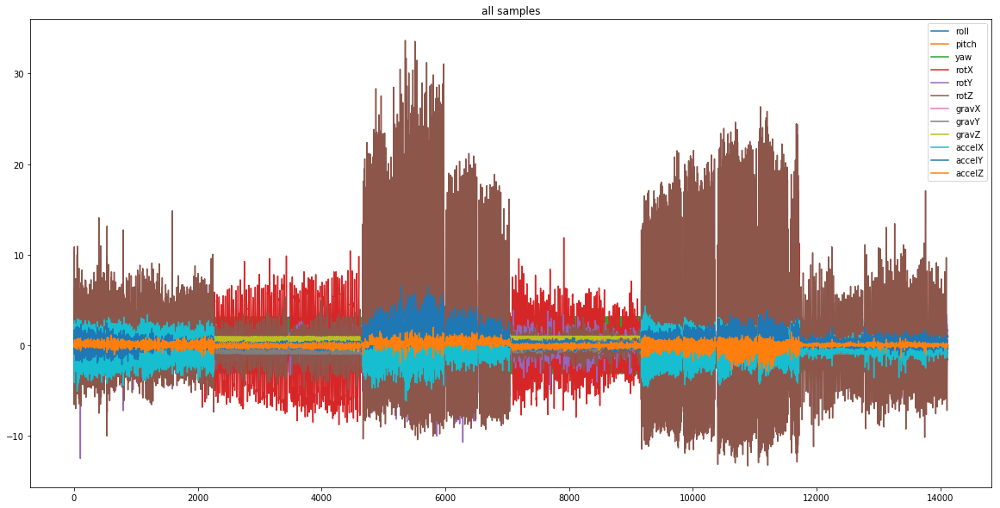

In [75]:
utils.plot_gesture_activity(valid_sf_no_rests)

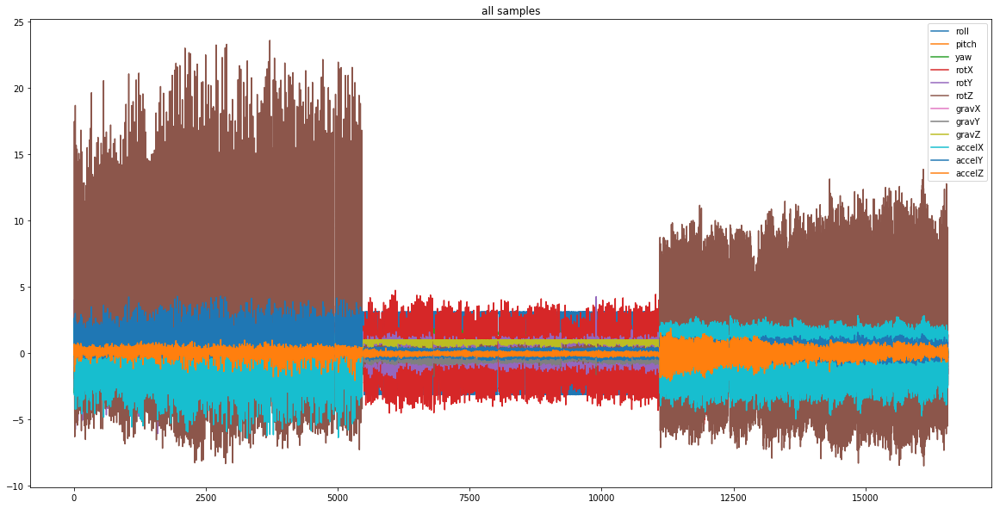

In [76]:
utils.plot_gesture_activity(test_sf_no_rests)

## Save cleaned data

After doing whatever other checks you want to do (look for missing values, incorrect data types, etc.), save your datasets to disk as binary `SFrame` objects for easy loading later.

In [77]:
train_sf.save('data/cleaned_train_sframe')
valid_sf.save('data/cleaned_valid_sframe')
test_sf.save('data/cleaned_test_sframe')